# Caso: Mercado inmobiliario

## Enunciado del problema y caso práctico.

Dentro de la sociedad globalizada e industrializada, es sabido que los precios de los inmuebles han presentado un constante cambio, por lo que quienes deseen invertir o vender una propiedad se enfrentan al fenómeno especulativo existente en la valorización de éstos. Esto, debido a la constante tendencia de las ciudades a crecer demográfica y comercialmente, llegando a un punto en donde no se tiene certeza de la valorización real dentro del sector en donde se desee invertir. Pese a que el precio depende, en cierta medida, de las tendencias que esté teniendo el mercado inmobiliario en un determinado tiempo, poder estimar adecuadamente el valor de una propiedad es una referencia clave para entender si es una buena oportunidad, ya sea de compra o de venta.

## Objetivo a tener en cuenta.

Usted ha sido contactado de una importante empresa inversora dentro del rubro de la inmobiliaria en Colombia, con el fin de que implemente un modelo de clasificación que permita clasificar el precio de las propiedades en venta, utilizando los datos que se han puesto a su disposición correspondientes al año 2020. Para esto, específicamente, debe predecir la categorización de las propiedades entre baratas o caras, considerando como criterio el valor promedio de los precios (la media). 

# Importar las librerias que se usarán

In [1]:
# Manipulación del DataFrame
import pandas as pd
import numpy as np

# Uso de RegEx
import re

# Gráficas y visualización
import folium
from folium import plugins
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

# Preprocesamiento
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

# Procesamiento
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf

# Evaluación del modelo
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Exportación del modelo de machine learning
import joblib

print('Librerias importadas !')

Librerias importadas !


# Carga y transformación de datos

## Visualización del dataset

### Creación de DataFrame

In [2]:
# Extraemos los datos del dataset
data = pd.read_csv('properties_colombia.csv')
print('DataFrame cargado !!!')

DataFrame cargado !!!


### Variables que posee el DataFrame

In [3]:
# Vemos las columnas que tiene el dataset
data.columns

Index(['Unnamed: 0', 'id', 'ad_type', 'start_date', 'end_date', 'created_on',
       'lat', 'lon', 'l1', 'l2', 'l3', 'l4', 'l5', 'l6', 'rooms', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'price_period', 'title', 'description', 'property_type',
       'operation_type', 'geometry'],
      dtype='object')

### Número de renglones y columas del DataFrame

In [4]:
# Su numero de filas y columnas
data.shape

(197549, 27)

### Tipos de datos de cada variable del DataFrame

In [5]:
# Tipo de variable que tenemos
data.dtypes

Unnamed: 0           int64
id                  object
ad_type             object
start_date          object
end_date            object
created_on          object
lat                float64
lon                float64
l1                  object
l2                  object
l3                  object
l4                  object
l5                  object
l6                  object
rooms              float64
bedrooms           float64
bathrooms          float64
surface_total      float64
surface_covered    float64
price              float64
currency            object
price_period        object
title               object
description         object
property_type       object
operation_type      object
geometry            object
dtype: object

### Gráfica de los valores nulos del DataFrame

<AxesSubplot:>

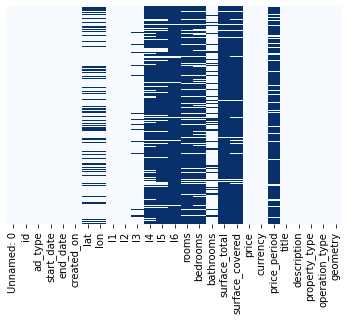

In [6]:
# Visualización de valores nulos en el DataFrame
sns.heatmap(data.isnull(), yticklabels = False, cbar = False, cmap = 'Blues')

Notamos que las columnas que tienen valores nulos son:
    
* **lat**
* **lon**
* **l3**
* **l4**
* **l5**
* **l6**
* **rooms**
* **bedrooms**
* **bathrooms**
* **surface_total**
* **surface_covered**
* **price_period**

A continuación, calcularémos la cantidad de valores faltantes y sus respectivos porcentajes.

In [7]:
# Obtenemos los valores nulos
Values_null = data.isnull().sum().tolist()
# Obtenemos el nombre de cada columna
Name_cols = data.columns.tolist()
# Obtenemos el número total de renglones en el DataFrame
Total_cols = data.shape[0]
# Calculamos el porcentaje de valores nulos
Porcentajes = [round(j*100/Total_cols,4) for j in Values_null]
# Creamos un diccionario temporal
dic_temp = {'Columna': Name_cols, 'Valores Nulos': Values_null, 'Porcentaje Valores Nulos': Porcentajes}
# Del diccionario temporal creamos un DataFrame para visualizar los datos
pd.DataFrame.from_dict(dic_temp)

,Columna,Valores Nulos,Porcentaje Valores Nulos
0,Unnamed: 0,0,0.0000
1,id,0,0.0000
2,ad_type,0,0.0000
3,start_date,0,0.0000
4,end_date,0,0.0000
5,created_on,0,0.0000
6,lat,49498,25.0561
7,lon,49498,25.0561
8,l1,0,0.0000
9,l2,0,0.0000


Muchas columnas tienen bastantes valores nulos, por lo tanto, antes de realizar cualquier modelo de Machine Learning debemos encontrar maneras de obtener infomación de otras columnas con el fin de disminuir la cantidad de valores faltantes, o ver si pueden ser eliminadas sin que afecte el análisis.

### Visualización más detallada del DataFrame

In [8]:
# Columnas: 'Unnamed: 0', 'id', 'ad_type', 'start_date', 'end_date', 'created_on', 'lat', 'lon','l1', 'l2', 'l3', 'l4', 'l5', 'l6'
data[['Unnamed: 0', 'id', 'ad_type', 'start_date', 'end_date', 'created_on', 'lat', 'lon','l1', 'l2', 'l3', 'l4', 'l5', 'l6']].head()

,Unnamed: 0,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,l4,l5,l6
0,861131,CScTjaFiP6yCzS8tFX0ZVA==,Propiedad,2020-12-14,9999-12-31,2020-12-14,6.203000,-75.572000,Colombia,Antioquia,Medellín,El Poblado,NaN,NaN
1,200972,DlCxox9+FuugkxS2kBVfJg==,Propiedad,2020-09-16,2021-05-14,2020-09-16,4.722748,-74.073115,Colombia,Cundinamarca,Bogotá D.C,Zona Noroccidental,Suba,NaN
2,554622,yitN1AigL45gh/K2YSF8rw==,Propiedad,2020-08-19,2020-08-20,2020-08-19,4.709000,-74.030000,Colombia,Cundinamarca,Bogotá D.C,Zona Norte,Usaquén,Bella Suiza
3,540321,hELQ9njwODbLMpATXieRdQ==,Propiedad,2020-11-23,2020-11-30,2020-11-23,NaN,NaN,Colombia,Santander,Bucaramanga,NaN,NaN,NaN
4,448920,aBCtKT7LDzt2CxJQ+gVFEA==,Propiedad,2020-10-06,2020-10-07,2020-10-06,NaN,NaN,Colombia,Antioquia,Medellín,NaN,NaN,NaN


In [9]:
# Columnas: 'rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency','price_period', 'title', 'description'
data[['rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency','price_period', 'title', 'description']].head()

,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description
0,NaN,4.0,4.0,NaN,NaN,9.000000e+09,COP,NaN,Hermosa Mansión En El Poblado. Área Construida...,<b>Hermosa Mansión En El Poblado. Área Constru...
1,NaN,3.0,2.0,NaN,NaN,6.250000e+08,COP,NaN,"APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NORTE",Venta apartamento en piso 16 con vista exterio...
2,NaN,NaN,2.0,NaN,NaN,4.200000e+08,COP,NaN,Apartamento En Venta En Bogota Bella Suiza Cod...,Al entrar a este bonito apartamento interior e...
3,NaN,NaN,1.0,NaN,NaN,1.310000e+09,COP,NaN,SE VENDE LOCAL COMERCIAL EN CABECERA DEL LLANO...,Se encuentra ubicado en el sector de la Cabece...
4,NaN,NaN,2.0,NaN,NaN,2.100000e+08,COP,NaN,Apartamento en Venta Ubicado en ITAGUI,Codigo Inmueble 4302 Apartamento con 3 habitac...


In [10]:
# Columnas: 'property_type','operation_type', 'geometry'
data[['property_type','operation_type', 'geometry']].head()

,property_type,operation_type,geometry
0,Casa,Venta,POINT (-75.572 6.203)
1,Apartamento,Venta,POINT (-74.0731146 4.7227485)
2,Casa,Venta,POINT (-74.03 4.709)
3,Otro,Venta,POINT EMPTY
4,Apartamento,Venta,POINT EMPTY


### Estadísticos

In [11]:
# Resumen global de estadisticos:
data.describe()

,Unnamed: 0,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,197549.000000,148051.000000,148051.000000,27537.000000,40525.000000,156467.000000,6974.000000,9.802000e+03,1.974860e+05
mean,497437.843851,5.666001,-75.041045,3.291208,3.239062,2.639279,1352.132349,9.483356e+02,6.436051e+08
std,290023.578338,2.196804,1.104575,1.754795,1.985636,1.437174,7713.769352,3.730875e+04,1.944868e+09
min,0.000000,-32.787342,-119.698190,1.000000,0.000000,1.000000,10.000000,1.000000e+00,0.000000e+00
25%,234211.000000,4.582315,-75.645126,3.000000,3.000000,2.000000,72.000000,7.100000e+01,2.000000e+08
50%,507385.000000,4.908611,-75.476654,3.000000,3.000000,2.000000,120.000000,1.140000e+02,3.300000e+08
75%,770037.000000,6.248101,-74.094001,4.000000,4.000000,3.000000,281.000000,2.160000e+02,6.000000e+08
max,993551.000000,34.420334,-67.482570,40.000000,96.000000,20.000000,180000.000000,3.480000e+06,3.450000e+11


Del resumen de estadísticos podemos observar que las columnas **'lat'** y **'lon'** poseen outliers, esto se analizará a profundidad más adelante.

### Análisis rápido de las categorías usando un histograma. 

array([[<AxesSubplot:title={'center':'Unnamed: 0'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lon'}>],
       [<AxesSubplot:title={'center':'rooms'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>],
       [<AxesSubplot:title={'center':'surface_total'}>,
        <AxesSubplot:title={'center':'surface_covered'}>,
        <AxesSubplot:title={'center':'price'}>]], dtype=object)

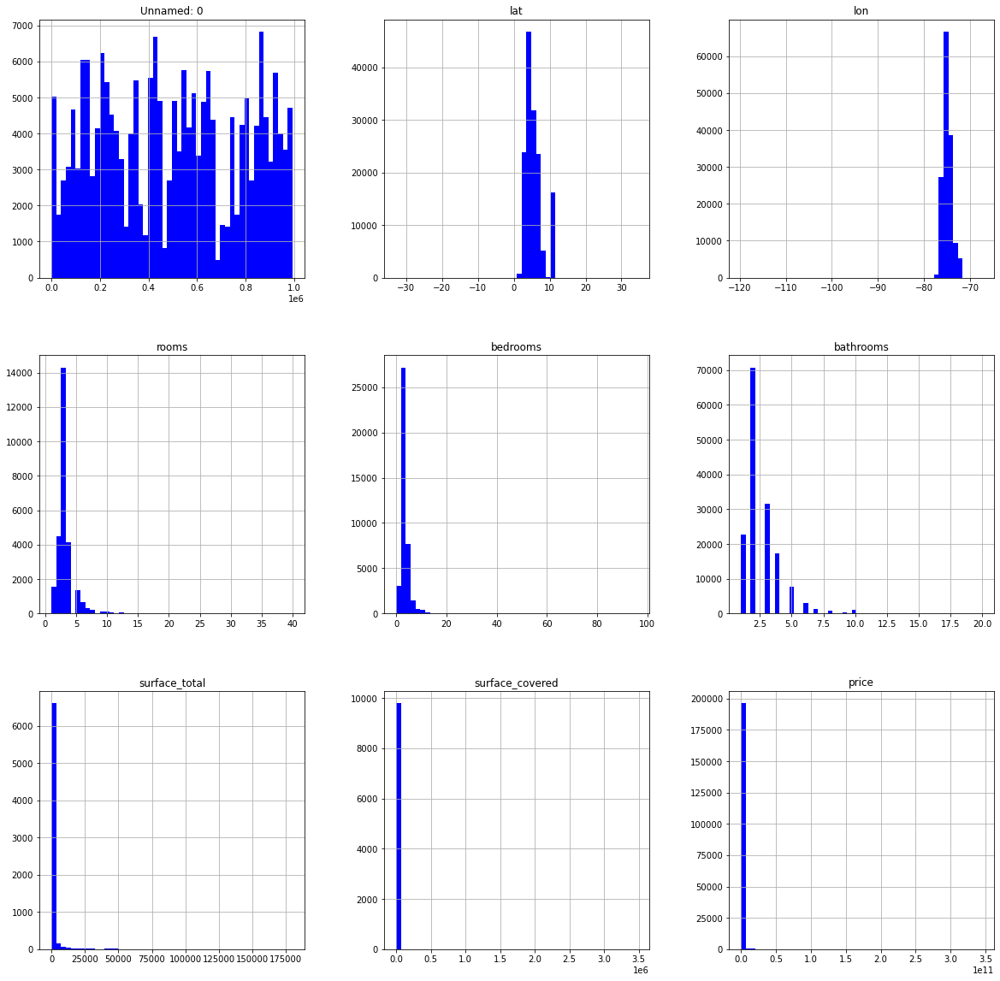

In [12]:
data.hist(bins = 50, figsize = (20,20), color = 'b')

**Unnamed: 0**: Es un ID y para este analisis no servira de mucho así que se eliminará.

**lat y lon**: Tienen una distribución aparentemente "normal", pero tienen algunos outliers.

**rooms y bedrooms**: Hay una distribución sesgada a la izquierda, con la mayoría de las casas con un promedio de 3 ambientes/cuartos. 

**bathrooms**: También con una distribución sesgada a la izquierda, con la mayoría de las casas con un promedio de 2 baños.

**surface_total y surface_covered**: Poseen en su mayoría valores nulos, lo cual hace muy dificil su análisis por ahora. Se tratará de obtener información para estas columnas más adelante. 

**price**: Es nuestra columna objetivo, y solo oscila entre 0 y 1, con 0 como el valor dominante, que clasificamos como "barato".  

### Matriz de correlación. 

Veremos como se relacionan las variables unas con otras.

<AxesSubplot:>

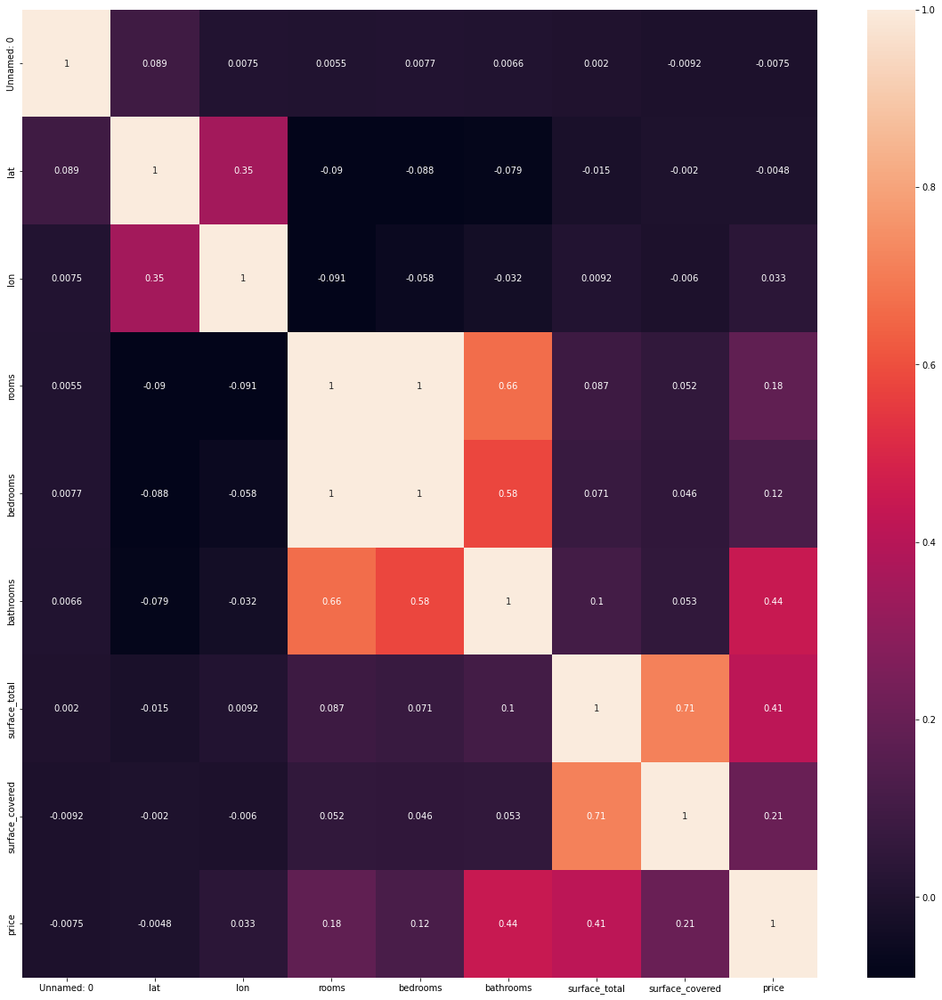

In [13]:
correlations = data.corr()
f, ax = plt.subplots(figsize = (20, 20))
sns.heatmap(correlations, annot = True)

De la matriz de correlación podemos concluir lo siguiente:

1) **"Unnamed: 0"** no esta correlacionada con ninguna variable.

2) **"lat" y "lon"** están correlacionadas entre sí.

3) **"rooms"** está:

    a. medianamente correlacionada con: **bathrooms**
    
    b. altamente correlacionada con: **bedrooms**
    
4) **"bedrooms"** está:

    a. medianamente correlacionada con: **bathrooms**
    
    b. altamente correlacionada con: **rooms**
    
5) **"bathrooms"** está:

    a. medianamente correlacionada con: **price**
    
    b. medianamente correlacionada con: **bedrooms**
    
    c. medianamente correlacionada con: **rooms**
    
6) **"surface_total"** está:

    a. medianamente correlacionada con: **price**
    
    b. altamente correlacionada con: **surface_covered**
    
7) **"surface_covered"** está:

    a. altamente correlacionada con: **surface_total**
    
8) **"price"** está:

    a. medianamente correlacionada con: **bathrooms**
    
    b. medianamente correlacionada con: **surface_total**
 

## Análisis de la columna: "currency"

Como se mostrará a continuación, contamos con dos divisas. Para el correcto análisis de nuestro modelo debemos dejar todo en función de una de ellas.

In [14]:
# Extraemos los valores unicos para saber que divisas tenemos
data['currency'].unique()

array(['COP', nan, 'USD'], dtype=object)

Vemos que hay 2 tipos de divisa en el DataFrame, 'COP' y 'USA'. Y también recordemos que posee una cantidad de valores nulos del 0.0339%. Como hay muy pocos valores faltantes, eliminaremos los registros con valores faltantes en esta columna.

In [15]:
# ELiminamos los valores faltantes en la columna 'currency'
data = data.dropna(subset=['currency'])
# Reestablecemos los indices
data.reset_index(inplace=True, drop=True)
# Mostramos que no hay valores faltantes
data['currency'].isnull().sum()

0

In [16]:
# Notamos que tampoco hay valores faltantes en la columna 'price' (se eliminaron junto con los de la columna 'currency')
data['price'].isnull().sum()

0

In [17]:
# Extraemos los valores unicos en la columna 'currency'
data['currency'].unique()

array(['COP', 'USD'], dtype=object)

Una ves que tenemos solo las dos divisas (sin valores nulos), pasarémos todos los valores de 'COP' a 'USD'. Tomaremos como referencia que 1 COP es igual a
0.00021 USD.

In [18]:
# DataFrame antes de efectuar los cambios
data[['price', 'currency']][5899:5905]

,price,currency
5899,2.250000e+08,COP
5900,7.500000e+05,USD
5901,3.000000e+09,COP
5902,1.750000e+08,COP
5903,1.050000e+08,COP
5904,1.980000e+08,COP


In [19]:
# Primero cambiarémos la columna 'price': 1 COP == 0.00021 USD
data['price'] = data[['price', 'currency']].apply(lambda x: x.price * 0.00021 if x.currency=='COP' else x.price, axis=1)
# Despues eliminarémos la columna 'currency', pues todo esta en 'USD' y no aporta más información
data.drop(['currency'], axis=1, inplace=True)
# DataFrame despues de efectuar los cambios
data[['price']][5899:5905]

,price
5899,47250.0
5900,750000.0
5901,630000.0
5902,36750.0
5903,22050.0
5904,41580.0


De esta forma el precio esta en una sola divisa, el USD.

## Análisis de la columna: "price"

Como se nos pide clasificar las propiedades en barata (0) y cara (1) tomando como referencia la media, lo primero que haremos será cambiar a binario la columna 'price'

In [20]:
# DataFrame antes de efectuar los cambios
data[['price']].head(5)

,price
0,1890000.0
1,131250.0
2,88200.0
3,275100.0
4,44100.0


In [21]:
# Calculamos la media
media = data['price'].mean()
# Si la propiedad es mayor a la media será clasificada como cara(1), en caso contrario como barata(0)
data['price'] = data['price'].apply(lambda x: 1 if x > media else 0)
# DataFrame despues de efectuar los cambios
data[['price']].head(5)

,price
0,1
1,0
2,0
3,1
4,0


## Análisis de las columnas: "title"-"description"

Ya que ambas columnas poseen texto con información relevante, las uniremos para despues analizarlas usando RegEx y extraer información relevante para nuestro modelo.

In [22]:
# La columna 'title' solo posee un valor nulo, en la fila: 82,716
data['title'][data['title'].isnull()]

82716    NaN
Name: title, dtype: object

In [23]:
# Este valor no es nulo en la columna 'description' como puede observarse
data['description'][82716]

'VENTA de Finca en RIONEGRO sector SAN NICOLAS,\xa0 con Area de 190\xa0Mts2contruidos y 10000\xa0Mts2 de terreno, 4\xa0alcobas, 3\xa0baños, 3 salas, comedor,Cocina Integral amplia, zona\xa0de ropas, cuarto de herramientas, parqueadero.\n\nCasa muy acogedora, amplia e iluminada, hermosa vista, arboles frutales, nacimiento de agua, casa de mayordomo.\n\nValor Venta $ 1.200.000.000\n\nUrve Inmobiliaria Colombia S.A.S\n'

Por lo tanto, uniremos ambas columnas (en una sola columna llamada 'anuncio') y solo eliminaremos los renglones faltantes tomando como referencia la columna 'description', ya que la cantidad de valores faltantes es de solo el 0.0613%. 

In [24]:
# Eliminamos los valores nulos de la columna 'description'
data = data.dropna(subset=['description'])
# Reestablecemos los indices
data.reset_index(inplace=True, drop=True)
# Verificamos que ya no hay valores faltantes
data['description'][data['description'].isnull()]

Series([], Name: description, dtype: object)

In [25]:
# Rellenamos el unico valor nulo en la columna 'title' para que no haya problema al concatenarlas
data[['title']] = data[['title']].fillna('X')
# Concatenamos las columnas 'title' y 'description' en una nueva columna llamada 'anuncio'
data['anuncio'] = data.title.str.cat(data.description)
# Mostramos el resultado
data['anuncio'].head(3)

0    Hermosa Mansión En El Poblado. Área Construida...
1    APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NOR...
2    Apartamento En Venta En Bogota Bella Suiza Cod...
Name: anuncio, dtype: object

In [26]:
# Por ultimo solo eliminamos las columnas 'title' y 'description' del DataFrame
data.drop(['title', 'description'], axis=1, inplace=True)
print(data.columns)
print(data.shape)

Index(['Unnamed: 0', 'id', 'ad_type', 'start_date', 'end_date', 'created_on',
       'lat', 'lon', 'l1', 'l2', 'l3', 'l4', 'l5', 'l6', 'rooms', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price',
       'price_period', 'property_type', 'operation_type', 'geometry',
       'anuncio'],
      dtype='object')
(197361, 25)


## Análisis de las columnas: "l1"-"ad_type"-"operation_type"-"price_period"

Las columnas **'l1'**, **'ad_type'**, **'operation_type'** y **'price_period'**, hacen referencia al país de donde se tomarón los datos (Colombia), Tipo de aviso (Propiedad), Tipo de operación (Venta) y Periodo del precio (Mensual) respectivamente. 

Estas columnas siempre tienen el mismo valor y por lo tanto no aportan valor para la clasificación así que se eliminarán.

In [27]:
# Valores unicos en la columna 'l1'
data['l1'].unique()

array(['Colombia'], dtype=object)

In [28]:
# Valores unicos en la columna 'ad_type'
data['ad_type'].unique()

array(['Propiedad'], dtype=object)

In [29]:
# Valores unicos en la columna 'operation_type'
data['operation_type'].unique()

array(['Venta'], dtype=object)

In [30]:
# Valores unicos en la columna 'price_period'
data['price_period'].unique()

array([nan, 'Mensual'], dtype=object)

Con esto demostramos que siempre tiene el mismo valor, así que procedemos a eliminarlas.

In [31]:
# Eliminamos las columnas: 'l1', 'ad_type' y 'operation_type'
data.drop(['l1', 'ad_type', 'operation_type','price_period'], axis=1, inplace=True)
print(data.columns)
print(data.shape)

Index(['Unnamed: 0', 'id', 'start_date', 'end_date', 'created_on', 'lat',
       'lon', 'l2', 'l3', 'l4', 'l5', 'l6', 'rooms', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'property_type',
       'geometry', 'anuncio'],
      dtype='object')
(197361, 21)


## Análisis de las columnas: "Unnamed: 0"-"id"

Las columnas 'Unnamed: 0' y 'id' hacen referencia a una clave para cada registro y al identificador del aviso (que no es único y cambia si el aviso es actualizado) respectivamente. 

Estas columnas, al ser solo identificadores no aportan valor para la clasificación así que se eliminarán.

In [32]:
# Muestra de la columna: 'Unnamed: 0'
data['Unnamed: 0'].head(3)

0    861131
1    200972
2    554622
Name: Unnamed: 0, dtype: int64

In [33]:
# Muestra de la columna: 'id'
data['id'].head(3)

0    CScTjaFiP6yCzS8tFX0ZVA==
1    DlCxox9+FuugkxS2kBVfJg==
2    yitN1AigL45gh/K2YSF8rw==
Name: id, dtype: object

In [34]:
# Eliminamos las columnas: 'Unnamed: 0' y 'id'
data.drop(['Unnamed: 0', 'id'], axis=1, inplace=True)
print(data.columns)
print(data.shape)

Index(['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l2', 'l3', 'l4',
       'l5', 'l6', 'rooms', 'bedrooms', 'bathrooms', 'surface_total',
       'surface_covered', 'price', 'property_type', 'geometry', 'anuncio'],
      dtype='object')
(197361, 19)


## Análisis de la columna: "geometry"

Esta columna corresponde a los puntos geométricos formados por las coordenadas latitud y longitud que ya tenemos en las columnas 'lat' y 'lon' respectivamente. 

Por lo tanto, eliminarémos la columna 'geometry' para no tener columnas duplicadas

In [35]:
# Eliminamos la columna: 'geometry'
data.drop(['geometry'], axis=1, inplace=True)
print(data.columns)
print(data.shape)

Index(['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l2', 'l3', 'l4',
       'l5', 'l6', 'rooms', 'bedrooms', 'bathrooms', 'surface_total',
       'surface_covered', 'price', 'property_type', 'anuncio'],
      dtype='object')
(197361, 18)


## Análisis de la columna: "start_date"-"end_date"-"created_on"

Estas columnas hacen referencia a la fecha de alta del aviso ('start_date'), fecha de baja del aviso ('end_date') y fecha de alta de la primera versión del aviso ('created_on').

Lo primero que harémos será ver en que año se realizarón estos anuncios.

In [36]:
# Vamos a dividir la columna 'start_date' en año, mes y dia:
start = data['start_date'].str.split('-',expand=True)
start = start.rename(columns={0:'start_anio', 1:'start_mes', 2:'start_dia'})
# Obtenemos los años:
start['start_anio'].unique()

array(['2020'], dtype=object)

In [37]:
# Obtenemos los meses:
start['start_mes'].unique()

array(['12', '09', '08', '11', '10', '07'], dtype=object)

In [38]:
# Vamos a dividir la columna 'start_date' en año, mes y dia:
end = data['end_date'].str.split('-',expand=True)
end = end.rename(columns={0:'end_anio', 1:'end_mes', 2:'end_dia'})
# Obtenemos los años:
end['end_anio'].unique()

array(['9999', '2021', '2020'], dtype=object)

In [39]:
# Obtenemos los meses:
end['end_mes'].unique()

array(['12', '05', '08', '11', '10', '03', '09', '02', '01', '07', '06',
       '04'], dtype=object)

In [40]:
# Vamos a dividir la columna 'start_date' en año, mes y dia:
created = data['created_on'].str.split('-',expand=True)
created = created.rename(columns={0:'created_on_anio', 1:'created_on_mes', 2:'created_on_dia'})
# Obtenemos los años:
created['created_on_anio'].unique()

array(['2020'], dtype=object)

In [41]:
# Obtenemos los meses:
created['created_on_mes'].unique()

array(['12', '09', '08', '11', '10', '07'], dtype=object)

Como se observa (salvo el error de: '9999'), todos los anuncios fueron publicados desde julio del 2020 hasta diciembre del 2021.  

Por lo tanto, al ser poco tiempo no se ve que esto afecte en el modelo y se eliminarán las columnas 'start_date', 'end_date' y 'created_on'.

In [42]:
# Eliminamos las columnas: 'start_date', 'end_date' y 'created_on'.
data.drop(['start_date', 'end_date', 'created_on'], axis=1, inplace=True)
print(data.columns)
print(data.shape)

Index(['lat', 'lon', 'l2', 'l3', 'l4', 'l5', 'l6', 'rooms', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price',
       'property_type', 'anuncio'],
      dtype='object')
(197361, 15)


## Análisis de la columna: "property_type"

Esta columna no tiene valores faltantes, pero es necesaria para obtener los valores de los registros 'otro'. Para poder obtener los valores 'Otro', usarémos RegEx con la columna 'anuncio'.

In [43]:
porc_val_act = round( sum(data['property_type']=='Otro') * 100 / data.shape[0], 4)
print(f'Porcentaje de valores "Otros" actualmente: {porc_val_act}%')

Porcentaje de valores "Otros" actualmente: 8.3715%


### RegEx

In [44]:
# Tipos de propiedades del DataFrame
data['property_type'].unique()

array(['Casa', 'Apartamento', 'Otro', 'Oficina', 'Finca', 'Lote',
       'Local comercial', 'Parqueadero'], dtype=object)

In [45]:
# Vemos de manera mas detallada la columna 'property_type' cuando su valor es 'Otro'
data[data['property_type']=='Otro']

,lat,lon,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type,anuncio
3,NaN,NaN,Santander,Bucaramanga,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1,Otro,SE VENDE LOCAL COMERCIAL EN CABECERA DEL LLANO...
14,5.085998,-75.625954,Caldas,Manizales,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,Otro,"Venta Finca Hotel La Cabaña, Manizales _ wasi2..."
24,4.677321,-74.052634,Cundinamarca,Bogotá D.C,Zona Chapinero,Chapinero,Chico Reservado,NaN,NaN,2.0,NaN,NaN,1,Otro,OFICINA EN VENTA EN CHICO NORTE II BOGOTA Sim...
39,5.094880,-75.589095,Caldas,Manizales,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,0,Otro,Vende casa campestre en la Cabaña _ wasi135287...
40,6.061000,-75.502998,Antioquia,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,Otro,Lote en Venta en el RetiroSe vende lote con he...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197316,NaN,NaN,Antioquia,Medellín,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,1,Otro,Local en Venta Ubicado en MEDELLINCodigo Inmue...
197322,2.485366,-76.580296,Cauca,Popayán,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,Otro,LOCAL EN VENTA EN VIA AL BOSQUE POPAYAN SimiC...
197343,6.217416,-75.570836,Antioquia,Medellín,El Poblado,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1,Otro,OFICINA EN VENTA EN POBLADO MEDELLIN SimiCRM6...
197349,NaN,NaN,Caldas,Palestina,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,1,Otro,Venta casa campestre Santaguada _ wasi2776737...


Para buscar los valores de 'Otro', agregaremos: Bodega, Hotel a la lista de valores unicos para buscalos con RegEx.

In [46]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
df = df[['property_type', 'anuncio']]
df.head(3)

,property_type,anuncio
0,Casa,Hermosa Mansión En El Poblado. Área Construida...
1,Apartamento,"APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NOR..."
2,Casa,Apartamento En Venta En Bogota Bella Suiza Cod...


In [47]:
# Usarémos esta función auxiliar para complementar
def complemento(x):
    if x=='local': return 'Local comercial'
    elif x=='casa': return 'Casa'
    elif x=='apartamento': return 'Apartamento'
    elif x=='oficina': return 'Oficina'
    elif x=='finca': return 'Finca'
    elif x=='lote': return 'Lote'
    elif x=='parqueadero': return 'Parqueadero'
    elif x=='hotel': return 'Hotel'
    elif x=='bodega': return 'Bodega'
    else: return 'Otro'


# RegEx a evaluar
regEx = re.compile(r'(?:casa|apartamento|oficina|finca|lote|local|parqueadero|hotel|bodega)')
# Lista donde se guardarán los 'property_type' encontrados en cada anuncio
otros = []
# Iteramos sobre toda la columna 'anuncio'
for texto in tqdm(df['anuncio'], desc='Ejecutando...'):
    print(" ", end='\r')
    # Pasamos el texto a minuscula
    texto_lower = str(texto).lower()
    # Buscamos en el texto la RegEx
    frase_extraida = re.findall(regEx, texto_lower)
    # Guardamos el 'property_type' encontrado en la RegEx
    if len(frase_extraida)!=0:
        otros.append(complemento(frase_extraida[0]))
    else:
        otros.append('Otro')

# Terminando de iterar en el DataFrame 'df', transformamos la lista a DataFrame 'df_otros'  
df_otros = pd.DataFrame(otros,  columns=['tipo_prop'])

# Concatenamos los DataFrames 'df' y 'df_otros'
df = pd.concat([df, df_otros], axis=1)

# Creamos la nueva columna 'tipo_prop_ok' en donde se pondrán los valores encontrados de cada 'property_type'
df['tipo_prop_ok'] = df[['property_type', 'tipo_prop']].apply(lambda x: x.tipo_prop if (x.property_type ==  'Otro') else x.property_type, axis=1)

# Eliminamos la columna 'property_type'
df.drop(['property_type', 'tipo_prop', 'anuncio'], axis=1, inplace=True)

# Mostramos el DataFrame
df

Ejecutando...:   0%|          | 0/197361 [00:00<?, ?it/s]

,tipo_prop_ok
0,Casa
1,Apartamento
2,Casa
3,Local comercial
4,Apartamento
...,...
197356,Apartamento
197357,Oficina
197358,Local comercial
197359,Casa


In [48]:
porc_val_act = round( sum(df['tipo_prop_ok']=='Otro') * 100 / df.shape[0], 4)
print(f'Porcentaje de valores "Otros" actualmente: {porc_val_act}%')

Porcentaje de valores "Otros" actualmente: 0.2234%


Vemos que la cantidad de valores 'Otros' se ha disminuido de **8.3715% a 0.2234%**. Esta cantidad de valores al ser pequeña se eliminará.

In [49]:
# Eliminamos la columna 'property_type' del DataFrmae 'data'
data.drop(['property_type'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df], axis = 1)
# Eliminamos los registros con valores 'Otro'
data = data.loc[(data != 'Otro').all(axis=1), :]
# Reestablecemos los indices
data.reset_index(inplace=True, drop=True)
data.tail()

,lat,lon,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok
196915,4.649682,-74.161950,Cundinamarca,Bogotá D.C,Zona Suroccidental,Kennedy,NaN,3.0,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento
196916,4.668000,-74.055000,Cundinamarca,Bogotá D.C,Zona Chapinero,Chapinero,El Retiro,NaN,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina
196917,3.413000,-76.541000,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial
196918,4.674874,-74.147077,Cundinamarca,Bogotá D.C,Zona Occidental,Fontibón,NaN,NaN,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa
196919,10.935994,-74.802899,Atlántico,Barranquilla,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento


## Análisis de las columnas: "lat"-"lon"

En estas columnas la cantidad de valores faltantes son del: 

* "lat" - latitud: 25.0561%.
* "lon" - longitud: 25.0561%.

Lo primero que haremos será ver si las coordenadas corresponden realmente a Colombia o si hay algunos outliers.

### Gráfica de coordendas con outliers

In [50]:
# Creamos un DataFrame auxiliar sin valores NaN
df = data.dropna(subset=['lat', 'lon'])
# Transformamos las columnas de 'lat' y 'lon' a un Array  
coordenadas = df[['lat', 'lon']].to_numpy()
coordenadas

array([[  6.203     , -75.572     ],
       [  4.7227485 , -74.0731146 ],
       [  4.709     , -74.03      ],
       ...,
       [  3.413     , -76.541     ],
       [  4.67487431, -74.14707691],
       [ 10.9359937 , -74.8028991 ]])

In [51]:
# Calculamos la media de la longitud y latitud para centrar el mapa que crearemos
lat_mean, lon_mean = df['lat'].mean(), df['lon'].mean()
# Creamos el objeto mapa
mapa = folium.Map(location=[lat_mean, lon_mean], zoom_start=3)
# Mostramos el mapa de calor para visualizar las coordenadas
HeatMap(coordenadas, radius=15, min_opacity=0.4).add_to(mapa)
mapa

<img src="_img/mapa_1.png">

Como se observa en el mapa de calor, hay algunas coordenadas que estan fuera de Colombia (en Estados Unidos y Chile). Por lo tanto, hay que limpiar los outliers.

### Limpieza de Outliers

Calcularemos los puntos de datos atípicos utilizando el método estadístico llamado rango intercuartílico (IQR). Usando el **IQR**, los puntos de datos atípicos son los que están por debajo de ${Q1 – 1.5 * IQR}$ o por encima de ${Q3 + 1.5 * IQR}$. 

**Q1** es el **percentil 25** y **Q3** es el **percentil 75** del conjunto de datos, y **IQR** representa el rango intercuartílico calculado por **Q3 menos Q1 (${IQR = Q3–Q1}$)**.

In [52]:
# Usamos solo las columnas 'lat' y 'lon'
df = df[['lat', 'lon']]
# Calculamos el percentil 25 (Q1), el percentil 75 (Q3) y el rango intercuartílico (IQR)
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
# Aplicamos las condicinoes al DataFrame para obtener los outliers 
outliers = df[((df<(Q1 - 1.5 * IQR)) | (df>(Q3 + 1.5 * IQR)))]
outliers = outliers.dropna(subset=['lat', 'lon'])
outliers

,lat,lon
6516,1.787000,-78.792000
7142,13.351917,-81.357450
18166,13.351917,-81.357450
20692,12.585000,-81.696000
35471,12.518269,-81.716482
69232,1.787434,-78.791265
70070,12.543000,-81.718000
71766,12.576855,-81.705052
106919,12.543000,-81.718000
108063,1.787434,-78.791265


Aunque la cantidad de outliers obtenidos es algo grande, podemos observar que hay dos que se destacan de entre ellos:

* index = 138233: (-32.787342, -71.207320)
* index = 148082: (34.420334, -119.698190)

In [53]:
# Eliminarémos lo registros atípicos del DataFrame original.
data.drop(138233, inplace=True)
data.drop(148082, inplace=True)
# Reestablecemos los indices
data.reset_index(inplace=True, drop=True)
data.tail(3)

,lat,lon,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok
196915,3.413000,-76.541000,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial
196916,4.674874,-74.147077,Cundinamarca,Bogotá D.C,Zona Occidental,Fontibón,NaN,NaN,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa
196917,10.935994,-74.802899,Atlántico,Barranquilla,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento


### Gráfica de coordendas sin outliers

In [54]:
# Creamos un DataFrame auxiliar sin valores NaN y sin outliers
df_free_OL = data.dropna(subset=['lat', 'lon'])
# Transformamos el DataFrame 'df_free_OL' a un Array  
coordenadas_free_OL = df_free_OL[['lat', 'lon']].to_numpy()
# Calculamos la media de la longitud y latitud para centrar el nuevo mapa que crearemos
lat_mean_free_OL, lon_mean_free_OL = df_free_OL['lat'].mean(), df_free_OL['lon'].mean()
# Creamos el objeto mapa
mapa_free_OL = folium.Map(location=[lat_mean_free_OL, lon_mean_free_OL], zoom_start=3)
# Mostramos el mapa de calor para visualizar las coordenadas
HeatMap(coordenadas_free_OL, radius=15, min_opacity=0.4).add_to(mapa_free_OL)
mapa_free_OL

<img src="_img/mapa_2.png">

Vemos que ya no hay outliers en el DataFrame, así que podemos hacer zoom y visualizar mejor la zona.

In [55]:
# Creamos el objeto mapa con mayor visibilidad a Colombia
mapa_free_OL = folium.Map(location=[lat_mean_free_OL, lon_mean_free_OL], zoom_start=6)
# Mostramos el mapa de calor para visualizar las coordenadas
HeatMap(coordenadas_free_OL, radius=20, min_opacity=0.4).add_to(mapa_free_OL)
mapa_free_OL

<img src="_img/mapa_3.png">

### Media de las coordenadas

Se intentó usar la librería **geopy** para extraer las direcciones de las coordenadas y obtener más información para las columnas 'l3' y 'l4' pero la cantidad de solicitudes era muy alta, lo que implicaba un tiempo demaciado grande, por lo tanto, se optó por la opción de filtrar por provincia, ciudad y barrio para obtener la media de las coordenadas y usarlo para disminuir la cantidad de valores faltantes en las columnas 'lat' y 'lon'.

In [56]:
# Creamos un nuevo DataFrame con los valores NaN como cero
df_match = data[['l2','l3','l4','lat','lon']].fillna(0)
df_match.head()

,l2,l3,l4,lat,lon
0,Antioquia,Medellín,El Poblado,6.203000,-75.572000
1,Cundinamarca,Bogotá D.C,Zona Noroccidental,4.722748,-74.073115
2,Cundinamarca,Bogotá D.C,Zona Norte,4.709000,-74.030000
3,Santander,Bucaramanga,0,0.000000,0.000000
4,Antioquia,Medellín,0,0.000000,0.000000


In [57]:
# Creamos otro DataFrame auxuliar
df_prom = data[['l2','l3','l4','lat','lon']]
df_prom = df_prom.dropna(subset=['lat', 'lon','l2','l3','l4'])
df_prom.head()

,l2,l3,l4,lat,lon
0,Antioquia,Medellín,El Poblado,6.203000,-75.572000
1,Cundinamarca,Bogotá D.C,Zona Noroccidental,4.722748,-74.073115
2,Cundinamarca,Bogotá D.C,Zona Norte,4.709000,-74.030000
6,Cundinamarca,Bogotá D.C,Zona Noroccidental,4.732379,-74.082150
8,Atlántico,Barranquilla,Olaya,10.977000,-74.809000


In [58]:
# Ubicamos las coordenadas faltantes en funcion de: 
#     l2 - Nivel administrativo 2, Provincia.
#     l3 - Nivel administrativo 3: Ciudad.
#     l4 - Nivel administrativo 4: Barrio.

for i in tqdm(range(len(df_match)), desc='Ejecutando...'):
    print(" ", end='\r')
    lat = df_match.loc[i, "lat"]
    lon = df_match.loc[i, "lon"]
    if lat == 0 and lon == 0:
        for j in range(len(df_prom)):
            l2 = df_match.loc[i, "l2"]
            l3 = df_match.loc[i, "l3"]
            l4 = df_match.loc[i, "l4"]
            coord = df_prom.loc[(df_prom['l2'] == l2) & (df_prom['l3'] == l3) & (df_prom['l4'] == l4)]
            df_match.loc[i, "lat"] = coord.lat.mean()
            df_match.loc[i, "lon"] = coord.lon.mean()
            break
print('\n')
val_nul = round(df_match['lat'].isnull().sum() * 100 / df_match.shape[0],4)
print(f'Porcentaje de valores nulos en las columnas "lat" y "lon": {val_nul}%')

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

 

Porcentaje de valores nulos en las columnas "lat" y "lon": 23.8505%


La cantidad de valores solo se ha reducido de 25.0561% a 23.8505%, usarémos como filtro solo la provincia y la ciudad, de esta forma el porcentaje bajará aun más.

In [59]:
# Ubicamos las coordenadas faltantes en funcion del: 
#     l2 - Nivel administrativo 2, Provincia.
#     l3 - Nivel administrativo 3: Ciudad.

df_match = df_match.fillna(0)

for i in tqdm(range(len(df_match)), desc='Ejecutando...'):
    print(" ", end='\r')
    lat = df_match.loc[i, "lat"]
    lon = df_match.loc[i, "lon"]
    if lat == 0 and lon == 0:
        for j in range(len(df_prom)):
            l2 = df_match.loc[i, "l2"]
            l3 = df_match.loc[i, "l3"]
            coord = df_prom.loc[(df_prom['l2'] == l2) & (df_prom['l3'] == l3)]
            df_match.loc[i, "lat"] = coord.lat.mean()
            df_match.loc[i, "lon"] = coord.lon.mean()
            break

val_nul = round(df_match['lat'].isnull().sum() * 100 / df_match.shape[0],4)
print(f'Porcentaje de valores nulos en las columnas "lat" y "lon": {val_nul}%')

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

Porcentaje de valores nulos en las columnas "lat" y "lon": 5.3205%


Observamos que esto ha disminuido el porcentaje de valores nulos drásticamente.

A continuación, aplicaremos estos cambios al DataFrame original.

In [60]:
# ELiminamos las columnas innecesarias del DataFrame auxiliar
df_match.drop(['l2', 'l3', 'l4'], axis=1, inplace=True)
# Renombramos las columnas del DataFrame auxiliar
df_match.rename(columns={'lat':'latitud', 'lon':'longitud'}, inplace=True)
# Combinamos con el DataFrame original
data = pd.concat([data, df_match], axis = 1)
# ELiminamos las columnas 'lat' y 'lon' del DataFrame original
data.drop(['lat', 'lon'], axis=1, inplace=True)
data.tail()

,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,latitud,longitud
196913,Cundinamarca,Bogotá D.C,Zona Suroccidental,Kennedy,NaN,3.0,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,4.649682,-74.161950
196914,Cundinamarca,Bogotá D.C,Zona Chapinero,Chapinero,El Retiro,NaN,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,4.668000,-74.055000
196915,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,3.413000,-76.541000
196916,Cundinamarca,Bogotá D.C,Zona Occidental,Fontibón,NaN,NaN,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,4.674874,-74.147077
196917,Atlántico,Barranquilla,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,10.935994,-74.802899


## Análisis de las columnas: "l2"-"l3"-"l4"

En estas columnas la cantidad de valores faltantes son del: 

* "l2" - Provincia: 0.0000%.
* "l3" - Ciudad: 5.5844%.
* "l4" - Barrio: 77.0351%.

Para poder obtener los valores que nos faltan en estas columnas (mayormente en la columna "l4") lo que harémos será una clasificación en función de la distancia Euclidiana mínima como se muestra a continuación.

In [61]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
# Eliminamos los registros que tengan valores nulos
df = data[['latitud', 'longitud', 'l2', 'l3', 'l4']].dropna()
# Reestablecemos los indices
df.reset_index(inplace=True, drop=True)
df.tail(3)

,latitud,longitud,l2,l3,l4
45198,4.649682,-74.161950,Cundinamarca,Bogotá D.C,Zona Suroccidental
45199,4.668000,-74.055000,Cundinamarca,Bogotá D.C,Zona Chapinero
45200,4.674874,-74.147077,Cundinamarca,Bogotá D.C,Zona Occidental


### Columna auxiliar: l234

Esta columna nos ayudará para hacer la clasificación.

In [62]:
# Creamos una función para hacer la unión de las combinaciones de las columnas 'l2', 'l3' y 'l4', y unirlas en una sola columna 'l234'
def mezcla_l234(x, y, z):
    return str(x) + '/' + str(y) + '/' + str(z)

# Aplicamos la función y creamos la columna 'l234'
df['l234'] = df[['l2', 'l3', 'l4']].apply(lambda x: mezcla_l234(x.l2, x.l3, x.l4), axis=1)
df.drop(['l2', 'l3', 'l4'], axis=1, inplace=True)
df

,latitud,longitud,l234
0,6.203000,-75.572000,Antioquia/Medellín/El Poblado
1,4.722748,-74.073115,Cundinamarca/Bogotá D.C/Zona Noroccidental
2,4.709000,-74.030000,Cundinamarca/Bogotá D.C/Zona Norte
3,4.732379,-74.082150,Cundinamarca/Bogotá D.C/Zona Noroccidental
4,10.977000,-74.809000,Atlántico/Barranquilla/Olaya
...,...,...,...
45196,4.716000,-74.031000,Cundinamarca/Bogotá D.C/Zona Norte
45197,4.636047,-74.147480,Cundinamarca/Bogotá D.C/Zona Suroccidental
45198,4.649682,-74.161950,Cundinamarca/Bogotá D.C/Zona Suroccidental
45199,4.668000,-74.055000,Cundinamarca/Bogotá D.C/Zona Chapinero


### Valores únicos

Estos 58 valores se usarán para clasificar los valores faltantes de las columnas 'l2', 'l3' y 'l4' en función de las coordenadas y la distancia Euclidiana mínima.

In [63]:
# Extraemos los valores únicos de la columna 'l234' que se usarán para clasificar en función de la media
lugares = df['l234'].unique().tolist()
# Creamos dos listas para guardar la longitud y latitud media de los valores unicos de la columna 'l234'
latitud = []
longitud = []
for lug in lugares:
    lat, lon = df[['latitud', 'longitud']][(df['l234']==lug)].mean()
    latitud.append(lat)
    longitud.append(lon)
    
# De esas listas creamos un DataFrame nuevo que tiene los 58 lugares unicos con sus respectivos latitud y longitud
df_lugares = pd.DataFrame(list(zip(lugares, latitud, longitud)), columns =['Lugares', 'Latutud', 'Longitud'])
df_lugares

,Lugares,Latutud,Longitud
0,Antioquia/Medellín/El Poblado,6.201140,-75.566415
1,Cundinamarca/Bogotá D.C/Zona Noroccidental,4.731660,-74.070472
2,Cundinamarca/Bogotá D.C/Zona Norte,4.712035,-74.038922
3,Atlántico/Barranquilla/Olaya,10.980736,-74.809273
4,Cundinamarca/Bogotá D.C/Zona Chapinero,4.660884,-74.060601
5,Cundinamarca/Bogotá D.C/Zona Suroccidental,4.627354,-74.164007
6,Cundinamarca/Bogotá D.C/Zona Sur,4.567588,-74.120903
7,Atlántico/Barranquilla/El Recreo,10.984048,-74.799006
8,Cundinamarca/Bogotá D.C/Zona Occidental,4.685664,-74.118967
9,Antioquia/Medellín/Candelaria,6.245484,-75.565622


### Clasificación euclidiana mínima

In [64]:
# Función para calcular la distancia euclidiana mínima
def DistEuclidianaMin(x, y):
    Ds = []
    for i in range(57):
        D2x = (x - latitud[i])**2
        D2y = (y - longitud[i])**2
        Ds.append((D2x + D2y)**0.5)
    tmp = min(Ds)
    index = Ds.index(tmp)
    return lugares[index]

# Hacemos cero los NaN en la columna 'latitud'
data['latitud'].fillna(0, inplace=True)

# Hacemos la clasificación en el DataFrame original
data['Clasificacion'] = data[['latitud', 'longitud']].apply(lambda x: DistEuclidianaMin(x.latitud, x.longitud) if x.latitud!=0 else 'NoFound', axis=1)
data[['latitud', 'longitud','l2', 'l3', 'l4', 'Clasificacion']].head()

,latitud,longitud,l2,l3,l4,Clasificacion
0,6.203000,-75.572000,Antioquia,Medellín,El Poblado,Antioquia/Medellín/El Poblado
1,4.722748,-74.073115,Cundinamarca,Bogotá D.C,Zona Noroccidental,Cundinamarca/Bogotá D.C/Zona Noroccidental
2,4.709000,-74.030000,Cundinamarca,Bogotá D.C,Zona Norte,Cundinamarca/Bogotá D.C/Zona Norte
3,7.125686,-73.116738,Santander,Bucaramanga,NaN,Santander/Bucaramanga/Mejoras Públicas
4,6.231827,-75.581138,Antioquia,Medellín,NaN,Antioquia/Medellín/Belén


In [65]:
# Vamos a dividir la columna 'Clasificacion' en 'clas_l2', 'clas_l3' y 'clas_l4':
split = data['Clasificacion'].str.split('/',expand=True)
split = split.rename(columns={0:'clas_l2', 1:'clas_l3', 2:'clas_l4'})
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, split], axis = 1)
data.tail()

,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,latitud,longitud,Clasificacion,clas_l2,clas_l3,clas_l4
196913,Cundinamarca,Bogotá D.C,Zona Suroccidental,Kennedy,NaN,3.0,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,4.649682,-74.161950,Cundinamarca/Bogotá D.C/Zona Suroccidental,Cundinamarca,Bogotá D.C,Zona Suroccidental
196914,Cundinamarca,Bogotá D.C,Zona Chapinero,Chapinero,El Retiro,NaN,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,4.668000,-74.055000,Cundinamarca/Bogotá D.C/Zona Chapinero,Cundinamarca,Bogotá D.C,Zona Chapinero
196915,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,3.413000,-76.541000,Valle del Cauca/Cali/San Fernando Nuevo,Valle del Cauca,Cali,San Fernando Nuevo
196916,Cundinamarca,Bogotá D.C,Zona Occidental,Fontibón,NaN,NaN,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,4.674874,-74.147077,Cundinamarca/Bogotá D.C/Zona Occidental,Cundinamarca,Bogotá D.C,Zona Occidental
196917,Atlántico,Barranquilla,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,10.935994,-74.802899,Atlántico/Barranquilla/Carrizal,Atlántico,Barranquilla,Carrizal


In [66]:
# Reemplazamos los valores faltantes en la columna l4
data['l4'].fillna(0, inplace=True)
data['l4_ok'] = data[['l4', 'clas_l4']].apply(lambda x: x.clas_l4 if (x.l4==0) else x.l4, axis=1)

val_nul = round(data['l4_ok'].isnull().sum() * 100 / data.shape[0], 4)
print(f'Porcentaje de valores nulos en la columna "l4_ok": {val_nul}%')

Porcentaje de valores nulos en la columna "l4_ok": 5.3205%


In [67]:
# Reemplazamos los valores faltantes en la columna l3
data['l3'].fillna(0, inplace=True)
data['l3_ok'] = data[['l3', 'clas_l3']].apply(lambda x: x.clas_l3 if (x.l3==0) else x.l3, axis=1)

val_nul = round(data['l3_ok'].isnull().sum() * 100 / data.shape[0], 4)
print(f'Porcentaje de valores nulos en la columna "l3_ok": {val_nul}%')

Porcentaje de valores nulos en la columna "l3_ok": 0.1635%


La cantidad de valores faltantes paras las columnas "l2"-"l3"-"l4" ha disminuido bastante:

* "l2" - Provincia: 0.0000% -> 0.0000%.
* "l3" - Ciudad: 5.5844% -> 0.1635%.
* "l4" - Barrio: 77.0351% -> 5.3205%.

In [68]:
# Por último eliminamos las columnas 'l3', 'l4', 'latitud', 'longitud', 'Clasificacion', 'clas_l2', 'clas_l3' y 'clas_l4'
data.drop(['l3', 'l4', 'latitud', 'longitud', 'Clasificacion', 'clas_l2', 'clas_l3', 'clas_l4'], axis=1, inplace=True)
data.tail()

,l2,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok
196913,Cundinamarca,Kennedy,NaN,3.0,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C
196914,Cundinamarca,Chapinero,El Retiro,NaN,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C
196915,Valle del Cauca,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali
196916,Cundinamarca,Fontibón,NaN,NaN,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C
196917,Atlántico,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla


## Análisis de las columnas: "l5"-"l6"

En estas columnas la cantidad de valores faltantes son del: 

* "l5" - Nivel administrativo 5: 86.1255%.
* "l6" - Nivel administrativo 6: 96.5239%.

Para estas columnas no tenemos forma de obtener más información y su cantidad de valores NaN es demaciado grande así que se eliminarán.

In [69]:
# Eliminamos las columnas 'l5' y 'l6'
data.drop(['l5', 'l6'], axis=1, inplace=True)
data.tail()

,l2,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok
196913,Cundinamarca,3.0,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C
196914,Cundinamarca,NaN,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C
196915,Valle del Cauca,NaN,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali
196916,Cundinamarca,NaN,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C
196917,Atlántico,NaN,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla


## Análisis de la columna: "bedrooms"

En esta columna la cantidad de valores faltantes es del 79.4861%. Para poder obtener los valores faltantes, usarémos RegEx con la columna 'anuncio'.

### RegEx

In [70]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
# Rellenamos los NaN con 0 para evitar problemas al manipular el DataFrmae
df[['bedrooms']] = df[['bedrooms']].fillna(0)
df.head(3)

,l2,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok
0,Antioquia,NaN,4.0,4.0,NaN,NaN,1,Hermosa Mansión En El Poblado. Área Construida...,Casa,El Poblado,Medellín
1,Cundinamarca,NaN,3.0,2.0,NaN,NaN,0,"APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NOR...",Apartamento,Zona Noroccidental,Bogotá D.C
2,Cundinamarca,NaN,0.0,2.0,NaN,NaN,0,Apartamento En Venta En Bogota Bella Suiza Cod...,Casa,Zona Norte,Bogotá D.C


Usarémos el siguiente procedimiento para obtener la mayor cantidad de valores faltantes

In [71]:
# Usarémos esta función auxiliar para pasar las letras (por ejemplo 'dos', 'siete', etc.) a entero (2, 7, etc.)
def aux_str2num(x):
    if x=='uno' or x=='un' or x=='una' or x=='cuarto' or x=='habitacion' or x=='habitación' or x=='alcoba' or x=='1': return 1
    elif x=='dos' or x=='dos1' or x=='dos2' or x=='dos3' or x=='dos4' or x=='dos5' or x=='5dos' or x=='dos6' or x=='dos7': return 2
    elif x=='tres' or x=='dostres' or x=='2tres' or x=='3tres' or x=='8tres' or x=='103tres': return 3
    elif x=='cuatro' or x=='4cuatro': return 4
    elif x=='cinco': return 5
    elif x=='seis': return 6
    elif x=='siete': return 7
    elif x=='ocho': return 8
    elif x=='nueve': return 9
    elif x=='diez': return 10
    elif x=='cuartos' or x=='habitaciones' or x=='alcobas': return 2
    else: return 0
    
# Usarémos esta función para pasar los string tipo número (por ejemplo '2', '7', etc.) a entero (2, 7, etc.)
def str2num(y):
    try:
        return int(y)
    except:
        return aux_str2num(y)
    
# RegEx a evaluar
regEx = re.compile(r'(?:(?:un|dos|tres|cuatro|cinco|seis|siete|ocho|nueve|diez|1|2|3|4|5|6|7|8|9|10)+ (?:cuartos|alcobas|alcoba|habitaciones|habitaci[oó]n|cuarto))|(?:cuartos|alcoba|alcobas|habitaciones|habitaci[oó]n|cuarto)')
# Lista donde se guardarán el número de "cuartos/habitaciones/alcobas" encontrados en cada anuncio
cuartos = []
# Iteramos sobre toda la columna 'anuncio'
for texto in tqdm(df['anuncio'], desc='Ejecutando...'):
    print(" ", end='\r')
    # Pasamos el texto a minuscula
    texto_lower = str(texto).lower()
    # Buscamos en el texto la RegEx
    frase_extraida = re.findall(regEx, texto_lower)
    # Creamos otra lista donde se guardarán los valores que coincidan con la RegEx
    val = []
    # Iteramos en cada RegEx encontrada para obtener el número de "cuartos/habitaciones/alcobas"
    for frase in frase_extraida:
        val.append(str2num(frase.split(' ')[0]))
    # Guardamos el número de "cuartos/habitaciones/alcobas" encontrado en la RegEx
    cuartos.append(sum(val))
    
# Terminando de iterar en el DataFrame 'df', transformamos la lista "cuartos/habitaciones/alcobas" a DataFrame 'df_cuartos'  
df_cuartos = pd.DataFrame(cuartos,  columns=['cuartos'])
# Concatenamos los DataFrames 'df' y 'df_cuartos'
df = pd.concat([df, df_cuartos], axis=1)

# Rellenamos los NaN de la columna 'bedrooms' con valores 0
df['bedrooms'].fillna(0, inplace=True)

# Creamos la nueva columna 'cuartos_ok' en donde se pondrán los valores encontrados de cada "cuartos/habitaciones/alcobas"
df['cuartos_ok'] = df[['bedrooms', 'cuartos']].apply(lambda x: x.cuartos if (x.bedrooms ==  0) else x.bedrooms, axis=1)

# Eliminamos la columna 'cuartos'
df.drop(['cuartos'], axis=1, inplace=True)

# Mostramos las columnas 'bedrooms' y 'cuartos_ok'
df[['bedrooms', 'cuartos_ok']]

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

,bedrooms,cuartos_ok
0,4.0,4.0
1,3.0,3.0
2,0.0,3.0
3,0.0,0.0
4,0.0,3.0
...,...,...
196913,3.0,3.0
196914,0.0,0.0
196915,0.0,0.0
196916,0.0,0.0


In [72]:
porc_val_act = round((df['cuartos_ok']==0).sum() * 100 / df.shape[0], 4)
print(f'Porcentaje de valores faltantes actualmente: {porc_val_act}%')

Porcentaje de valores faltantes actualmente: 22.3387%


Vemos que la cantidad de faltantes ha disminuido bastante (de **79.4861 %** a **22.3387 %** ) gracias al uso de RegEx.

In [73]:
# Eliminamos la columna 'bedrooms' del DataFrmae 'data'
data.drop(['bedrooms'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df[['cuartos_ok']]], axis = 1)
data.tail()

,l2,rooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok
196913,Cundinamarca,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0
196914,Cundinamarca,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0
196915,Valle del Cauca,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0
196916,Cundinamarca,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,0.0
196917,Atlántico,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0


### Outliers

Como se puede observar, la columna 'cuartos_ok' tiene varios outliers. 

In [74]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
df.describe()

,rooms,bathrooms,surface_total,surface_covered,price,cuartos_ok
count,27357.000000,156110.000000,6934.000000,9.748000e+03,196918.000000,1.969180e+05
mean,3.287934,2.638665,1331.077156,9.471138e+02,0.233940,1.172588e+04
std,1.750033,1.433098,7653.839954,3.740871e+04,0.423336,5.557876e+05
min,1.000000,1.000000,10.000000,1.000000e+00,0.000000,0.000000e+00
25%,3.000000,2.000000,72.000000,7.100000e+01,0.000000,1.000000e+00
50%,3.000000,2.000000,120.000000,1.140000e+02,0.000000,3.000000e+00
75%,4.000000,3.000000,280.000000,2.150000e+02,0.000000,4.000000e+00
max,40.000000,20.000000,180000.000000,3.480000e+06,1.000000,2.764391e+07


#### Gráficas con outliers

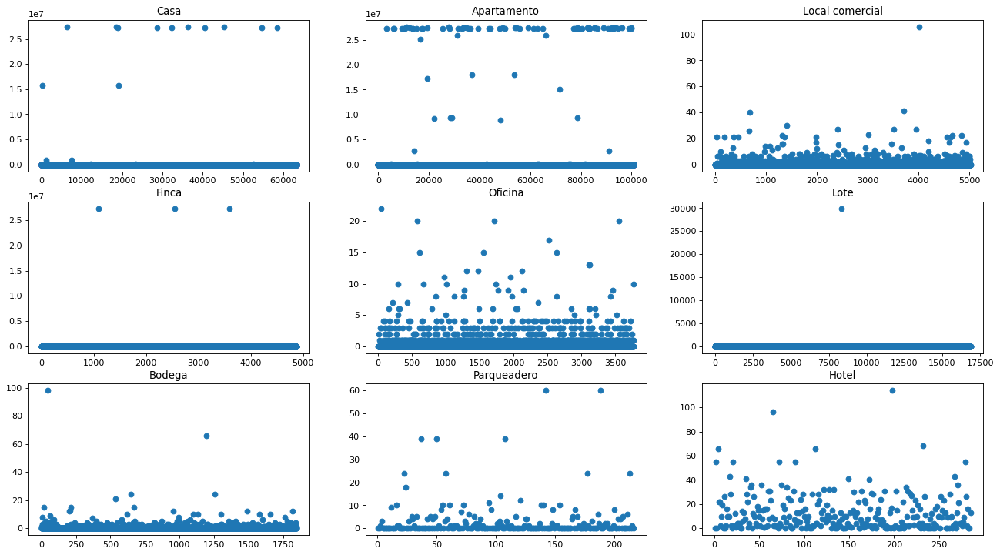

In [75]:
plt.figure(figsize=(20, 15), dpi=80)

tipo = 'Casa'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 1)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Casa")

tipo = 'Apartamento'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 2)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Apartamento")

tipo = 'Local comercial'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 3)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Local comercial")

tipo = 'Finca'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 4)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Finca")

tipo = 'Oficina'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 5)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Oficina")

tipo = 'Lote'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 6)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Lote")

tipo = 'Bodega'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 7)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Bodega")

tipo = 'Parqueadero'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 8)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Parqueadero")

tipo = 'Hotel'
numero = df['cuartos_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 9)
plt.scatter(eje_x, df['cuartos_ok'][df['tipo_prop_ok']==tipo])
plt.title("Hotel")

plt.show()

En las gráficas se ve más claramente como sí hay outliers en los diferentes tipos de propiedades. Por ejemplo, es ilógico que haya más de dos millones de cuartos en una casa o en un apartamento.

#### Corrección de outliers

Calcularemos los puntos de datos atípicos utilizando el método estadístico llamado rango intercuartílico (IQR). Usando el **IQR**, los puntos de datos atípicos son los que están por debajo de ${Q1 – 1.5 * IQR}$ o por encima de ${Q3 + 1.5 * IQR}$. 

**Q1** es el **percentil 25** y **Q3** es el **percentil 75** del conjunto de datos, y **IQR** representa el rango intercuartílico calculado por **Q3 menos Q1 (${IQR = Q3–Q1}$)**.

In [76]:
# Tipos de propiedades
tipos = df['tipo_prop_ok'].unique().tolist()
# Calculamos el percentil 25 (Q1), el percentil 75 (Q3) y el rango intercuartílico (IQR)
Q1 = [df['cuartos_ok'][(df['tipo_prop_ok']==tipo) & (df['cuartos_ok']!=0)].quantile(0.25) for tipo in tipos]
Q3 = [df['cuartos_ok'][(df['tipo_prop_ok']==tipo) & (df['cuartos_ok']!=0)].quantile(0.75) for tipo in tipos]
IQR = [Q3[i] - Q1[i] for i in range(len(Q1))]
# Calculamos los outliers minimo (OL_min), maximo (OL_max) y su promedio (Qm)
OL_min = [round(Q1[i] - 1.5 * IQR[i]) if Q1[i] - 1.5 * IQR[i] >= 0 else 0 for i in range(len(Q1))]
OL_max = [round(Q3[i] + 1.5 * IQR[i]) for i in range(len(Q1))]
Qm = [round((OL_min[i] + OL_max[i])/2) for i in range(len(Q1))]

#
def AjusteTipoPropiedad(cuar, tp):
    idx = tipos.index(tp)
    if (cuar>=OL_min[idx] and cuar<=OL_max[idx]):
        return cuar
    elif cuar>OL_max[idx]:
        return Qm[idx]
    
df['cuartos_ok2'] = df[['cuartos_ok', 'tipo_prop_ok']].apply(lambda x: AjusteTipoPropiedad(x.cuartos_ok, x.tipo_prop_ok), axis=1)

#### Gráficas sin outliers

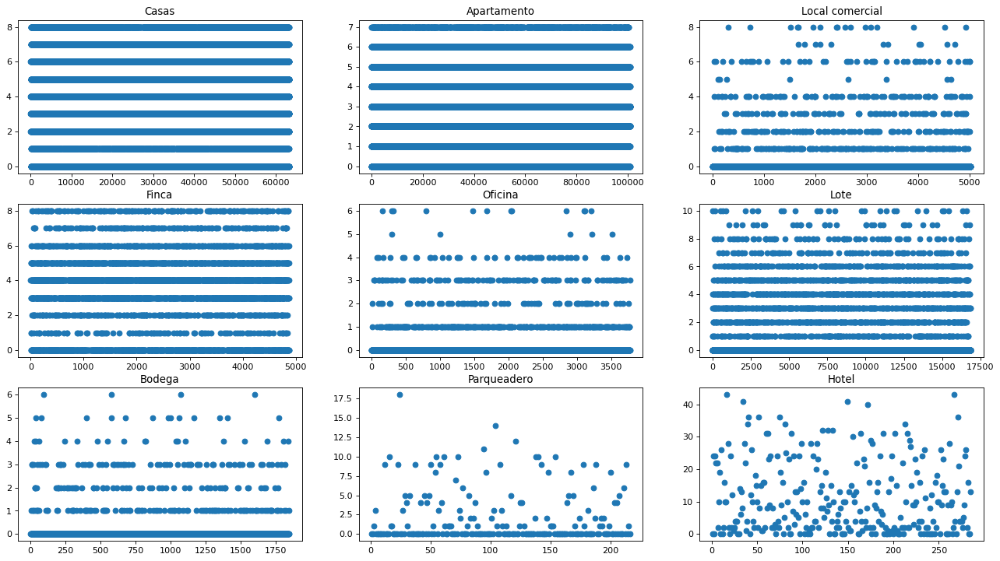

In [77]:
plt.figure(figsize=(20, 15), dpi=80)

tipo = 'Casa'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 1)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Casas")

tipo = 'Apartamento'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 2)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Apartamento")

tipo = 'Local comercial'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 3)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Local comercial")

tipo = 'Finca'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 4)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Finca")

tipo = 'Oficina'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 5)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Oficina")

tipo = 'Lote'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 6)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Lote")

tipo = 'Bodega'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 7)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Bodega")

tipo = 'Parqueadero'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 8)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Parqueadero")

tipo = 'Hotel'
numero = df['cuartos_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 9)
plt.scatter(eje_x, df['cuartos_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Hotel")

plt.show()

In [78]:
# Eliminamos la columna 'cuartos_ok' del DataFrmae 'data'
data.drop(['cuartos_ok'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df[['cuartos_ok2']]], axis = 1)
data.tail()

,l2,rooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2
196913,Cundinamarca,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0
196914,Cundinamarca,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0
196915,Valle del Cauca,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0
196916,Cundinamarca,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,0.0
196917,Atlántico,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0


### Mediana

Para afinar aun más los datos, podemos usar la **mediana** tomando como referencia la **provincia, ciudad, barrio y el tipo de propiedad.** Esto servirá para dar una cantidad de cuartos de acuerdo a la media de cuartos que tiene cada tipo de propiedad y a la zona donde se encuentre.

In [79]:
# Creamos dos DataFrames auxiliares más
df_med = data[['l2', 'l3_ok', 'l4_ok', 'cuartos_ok2', 'tipo_prop_ok']].dropna()
df_match = data[['l2', 'l3_ok', 'l4_ok', 'cuartos_ok2', 'tipo_prop_ok']].fillna(0)
df_match.head()

,l2,l3_ok,l4_ok,cuartos_ok2,tipo_prop_ok
0,Antioquia,Medellín,El Poblado,4.0,Casa
1,Cundinamarca,Bogotá D.C,Zona Noroccidental,3.0,Apartamento
2,Cundinamarca,Bogotá D.C,Zona Norte,3.0,Casa
3,Santander,Bucaramanga,Mejoras Públicas,0.0,Local comercial
4,Antioquia,Medellín,Belén,3.0,Apartamento


In [80]:
# Ubicamos los valores faltantes con la media en funcion del: 
#     l2 - Nivel administrativo 2, usualmente provincia.
#     l3_ok - Nivel administrativo 3: usualmente ciudad.
#     l4_ok - Nivel administrativo 4: usualmente barrio.
#     tipo_prop_ok - Tipo de propiedad ('Casa', 'Apartamento', 'Local comercial', 'Finca', 'Oficina', 'Lote', 'Bodega', 'Parqueadero', 'Hotel').

for i in tqdm(range(len(df_match)), desc='Ejecutando...'):
    print(" ", end='\r')
    Var = df_match.loc[i, 'cuartos_ok2']
    if Var == 0:
        l2 = df_match.loc[i, 'l2']
        l3 = df_match.loc[i, 'l3_ok']
        l4 = df_match.loc[i, 'l4_ok']
        PT = df_match.loc[i, 'tipo_prop_ok']
        X = df_med.loc[(df_med['l2'] == l2) & (df_med['l3_ok'] == l3) & (df_med['l4_ok'] == l4) & (df_med['tipo_prop_ok'] == PT)]
        df_match.loc[i, 'cuartos_ok2'] = X.cuartos_ok2.median()

df_match = df_match[['l2', 'l3_ok', 'l4_ok', 'cuartos_ok2', 'tipo_prop_ok']].fillna(0)
porc_val_act = round((df_match['cuartos_ok2']==0).sum() * 100 / df_match.shape[0], 4)
print(f'Porcentaje de valores faltantes actualmente: {porc_val_act}%')

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

Porcentaje de valores faltantes actualmente: 12.915%


La cantidad de valores faltantes ha disminuido ahora a solo un **12.915 %** gracias a la ubicación de la propiedad.

In [81]:
# Eliminamos la columna 'cuartos_ok2' del DataFrmae 'data'
data.drop(['cuartos_ok2'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df_match[['cuartos_ok2']]], axis = 1)
data.tail()

,l2,rooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2
196913,Cundinamarca,3.0,NaN,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0
196914,Cundinamarca,NaN,1.0,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0
196915,Valle del Cauca,NaN,1.0,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0
196916,Cundinamarca,NaN,2.0,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0
196917,Atlántico,NaN,1.0,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0


## Análisis de la columna: "bathrooms"

En esta columna la cantidad de valores faltantes es del 20.7959%. Para poder obtener los valores faltantes, usarémos RegEx con la columna 'anuncio'.

### RegEx

In [82]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
# Rellenamos los NaN con 0 para evitar problemas al manipular el DataFrmae
df[['bathrooms']] = df[['bathrooms']].fillna(0)
df.head(3)

,l2,rooms,bathrooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2
0,Antioquia,NaN,4.0,NaN,NaN,1,Hermosa Mansión En El Poblado. Área Construida...,Casa,El Poblado,Medellín,4.0
1,Cundinamarca,NaN,2.0,NaN,NaN,0,"APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NOR...",Apartamento,Zona Noroccidental,Bogotá D.C,3.0
2,Cundinamarca,NaN,2.0,NaN,NaN,0,Apartamento En Venta En Bogota Bella Suiza Cod...,Casa,Zona Norte,Bogotá D.C,3.0


Usarémos el siguiente procedimiento para obtener la mayor cantidad de valores faltantes

In [83]:
# Usarémos esta función auxiliar para pasar las letras (por ejemplo 'dos', 'siete', etc.) a entero (2, 7, etc.)
def aux_str2num(x):
    if x=='uno' or x=='un' or x=='baño': return 1
    elif x=='dos': return 2
    elif x=='tres': return 3
    elif x=='cuatro': return 4
    elif x=='cinco': return 5
    elif x=='seis': return 6
    elif x=='siete': return 7
    elif x=='ocho': return 8
    elif x=='nueve': return 9
    elif x=='diez': return 10
    elif x=='baños' : return 2
    else: return 0
    
# Usarémos esta función para pasar los string tipo número (por ejemplo '2', '7', etc.) a entero (2, 7, etc.)
def str2num(y):
    try:
        return int(y)
    except:
        return aux_str2num(y)
    
# RegEx a evaluar
regEx = re.compile(r'(?:(?:un|dos|tres|cuatro|cinco|seis|siete|ocho|nueve|diez|1|2|3|4|5|6|7|8|9|10)+ (?:baño|baños))|(?:baño|baños)')
# Lista donde se guardarán el número de "baños/baño" encontrados en cada anuncio
banios = []
# Iteramos sobre toda la columna 'anuncio'
for texto in tqdm(df['anuncio'], desc='Ejecutando...'):
    print(" ", end='\r')
    # Pasamos el texto a minuscula
    texto_lower = str(texto).lower()
    # Buscamos en el texto la RegEx
    frase_extraida = re.findall(regEx, texto_lower)
    # Creamos otra lista donde se guardarán los valores que coincidan con la RegEx
    val = []
    # Iteramos en cada RegEx encontrada para obtener el número de "baños/baño"
    for frase in frase_extraida:
        val.append(str2num(frase.split(' ')[0]))
    # Guardamos el número de "baños/baño" encontrado en la RegEx
    banios.append(sum(val))
    
# Terminando de iterar en el DataFrame 'df', transformamos la lista "baños/baño" a DataFrame 'df_banios'  
df_banios = pd.DataFrame(banios,  columns=['banios'])
# Concatenamos los DataFrames 'df' y 'df_banios'
df = pd.concat([df, df_banios], axis=1)

# Rellenamos los NaN de la columna 'bathrooms' con valores 0
df['bathrooms'].fillna(0, inplace=True)

# Creamos la nueva columna 'bainos_ok' en donde se pondrán los valores encontrados de cada "baños/baño"
df['banios_ok'] = df[['bathrooms', 'banios']].apply(lambda x: x.banios if (x.bathrooms ==  0) else x.bathrooms, axis=1)

# Eliminamos la columna 'banios'
df.drop(['banios'], axis=1, inplace=True)

# Mostramos las columnas 'bathrooms' y 'banios_ok'
df[['bathrooms', 'banios_ok']]

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

,bathrooms,banios_ok
0,4.0,4.0
1,2.0,2.0
2,2.0,2.0
3,1.0,1.0
4,2.0,2.0
...,...,...
196913,0.0,1.0
196914,1.0,1.0
196915,1.0,1.0
196916,2.0,2.0


In [84]:
porc_val_act = round((df['banios_ok']==0).sum() * 100 / df.shape[0], 4)
print(f'Porcentaje de valores faltantes actualmente: {porc_val_act}%')

Porcentaje de valores faltantes actualmente: 11.2397%


Vemos que la cantidad de faltantes ha disminuido (de **20.7959 %** a **11.2397 %** ) gracias al uso de RegEx.

In [85]:
# Eliminamos la columna 'bathrooms' del DataFrmae 'data'
data.drop(['bathrooms'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df[['banios_ok']]], axis = 1)
data.tail()

,l2,rooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok
196913,Cundinamarca,3.0,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0
196914,Cundinamarca,NaN,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0
196915,Valle del Cauca,NaN,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0,1.0
196916,Cundinamarca,NaN,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0,2.0
196917,Atlántico,NaN,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0,1.0


### Outliers

Vamos a comprobar si la columna 'banios_ok' tiene outliers. 

In [86]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
df.describe()

,rooms,surface_total,surface_covered,price,cuartos_ok2,banios_ok
count,27357.000000,6934.000000,9.748000e+03,196918.000000,196918.000000,196918.000000
mean,3.287934,1331.077156,9.471138e+02,0.233940,3.012175,2.336729
std,1.750033,7653.839954,3.740871e+04,0.423336,1.779657,1.809947
min,1.000000,10.000000,1.000000e+00,0.000000,0.000000,0.000000
25%,3.000000,72.000000,7.100000e+01,0.000000,2.000000,1.000000
50%,3.000000,120.000000,1.140000e+02,0.000000,3.000000,2.000000
75%,4.000000,280.000000,2.150000e+02,0.000000,4.000000,3.000000
max,40.000000,180000.000000,3.480000e+06,1.000000,43.000000,125.000000


#### Gráficas con outliers

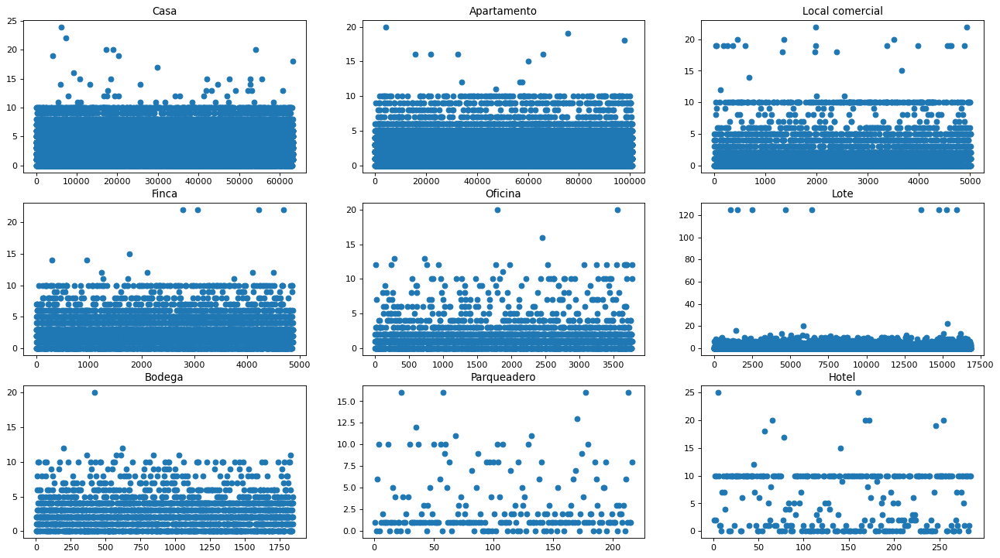

In [87]:
plt.figure(figsize=(20, 15), dpi=80)

tipo = 'Casa'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 1)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Casa")

tipo = 'Apartamento'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 2)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Apartamento")

tipo = 'Local comercial'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 3)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Local comercial")

tipo = 'Finca'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 4)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Finca")

tipo = 'Oficina'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 5)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Oficina")

tipo = 'Lote'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 6)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Lote")

tipo = 'Bodega'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 7)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Bodega")

tipo = 'Parqueadero'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 8)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Parqueadero")

tipo = 'Hotel'
numero = df['banios_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 9)
plt.scatter(eje_x, df['banios_ok'][df['tipo_prop_ok']==tipo])
plt.title("Hotel")

plt.show()

En las gráficas se ve más claramente como sí hay outliers en los diferentes tipos de propiedades. Por ejemplo, es ilógico que haya 20 baños en una casa o en un apartamento.

#### Corrección de outliers

Calcularemos los puntos de datos atípicos utilizando el método estadístico llamado rango intercuartílico (IQR). Usando el **IQR**, los puntos de datos atípicos son los que están por debajo de ${Q1 – 1.5 * IQR}$ o por encima de ${Q3 + 1.5 * IQR}$. 

**Q1** es el **percentil 25** y **Q3** es el **percentil 75** del conjunto de datos, y **IQR** representa el rango intercuartílico calculado por **Q3 menos Q1 (${IQR = Q3–Q1}$)**.

In [88]:
# Tipos de propiedades
tipos = df['tipo_prop_ok'].unique().tolist()
# Calculamos el percentil 25 (Q1), el percentil 75 (Q3) y el rango intercuartílico (IQR)
Q1 = [df['banios_ok'][(df['tipo_prop_ok']==tipo) & (df['banios_ok']!=0)].quantile(0.25) for tipo in tipos]
Q3 = [df['banios_ok'][(df['tipo_prop_ok']==tipo) & (df['banios_ok']!=0)].quantile(0.75) for tipo in tipos]
IQR = [Q3[i] - Q1[i] for i in range(len(Q1))]
# Calculamos los outliers minimo (OL_min), maximo (OL_max) y su promedio (Qm)
OL_min = [round(Q1[i] - 1.5 * IQR[i]) if Q1[i] - 1.5 * IQR[i] >= 0 else 0 for i in range(len(Q1))]
OL_max = [round(Q3[i] + 1.5 * IQR[i]) for i in range(len(Q1))]
Qm = [round((OL_min[i] + OL_max[i])/2) for i in range(len(Q1))]

#
def AjusteTipoPropiedad(ban, tp):
    idx = tipos.index(tp)
    if (ban>=OL_min[idx] and ban<=OL_max[idx]):
        return ban
    elif ban>OL_max[idx]:
        return Qm[idx]
    
df['banios_ok2'] = df[['banios_ok', 'tipo_prop_ok']].apply(lambda x: AjusteTipoPropiedad(x.banios_ok, x.tipo_prop_ok), axis=1)

#### Gráficas sin outliers

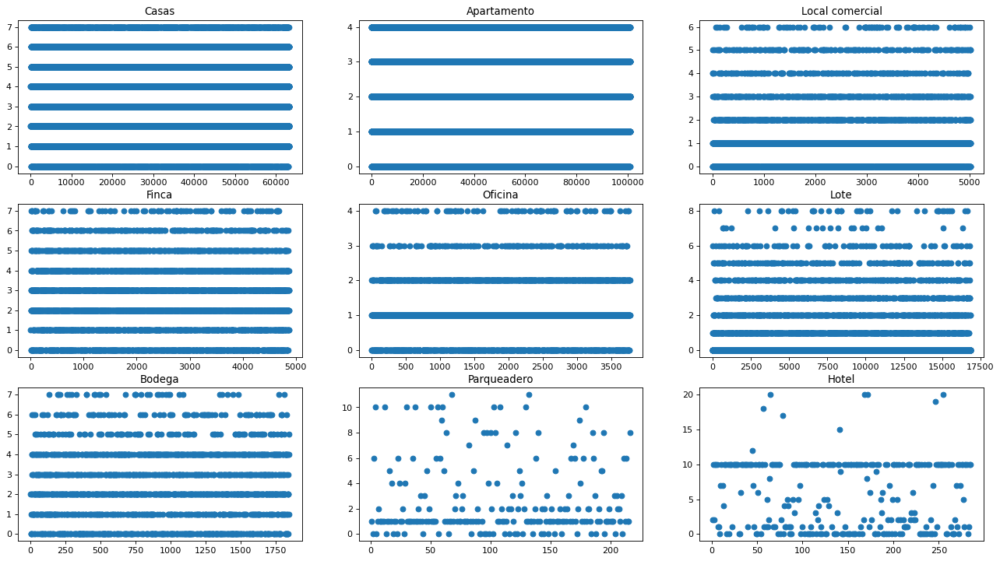

In [89]:
plt.figure(figsize=(20, 15), dpi=80)

tipo = 'Casa'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 1)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Casas")

tipo = 'Apartamento'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 2)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Apartamento")

tipo = 'Local comercial'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 3)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Local comercial")

tipo = 'Finca'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 4)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Finca")

tipo = 'Oficina'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 5)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Oficina")

tipo = 'Lote'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 6)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Lote")

tipo = 'Bodega'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 7)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Bodega")

tipo = 'Parqueadero'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 8)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Parqueadero")

tipo = 'Hotel'
numero = df['banios_ok2'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 9)
plt.scatter(eje_x, df['banios_ok2'][df['tipo_prop_ok']==tipo])
plt.title("Hotel")

plt.show()

In [90]:
# Eliminamos la columna 'banios_ok' del DataFrmae 'data'
data.drop(['banios_ok'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df[['banios_ok2']]], axis = 1)
data.tail()

,l2,rooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2
196913,Cundinamarca,3.0,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0
196914,Cundinamarca,NaN,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0
196915,Valle del Cauca,NaN,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0,1.0
196916,Cundinamarca,NaN,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0,2.0
196917,Atlántico,NaN,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0,1.0


### Mediana

Para afinar aun más los datos, podemos usar la **mediana** tomando como referencia la **provincia, ciudad, barrio y el tipo de propiedad.** Esto servirá para dar una cantidad de baños de acuerdo a la media de baños que tiene cada tipo de propiedad y a la zona donde se encuentre.

In [91]:
# Creamos dos DataFrames auxiliares más
df_med = data[['l2', 'l3_ok', 'l4_ok', 'banios_ok2', 'tipo_prop_ok']].dropna()
df_match = data[['l2', 'l3_ok', 'l4_ok', 'banios_ok2', 'tipo_prop_ok']].fillna(0)
df_match.head()

,l2,l3_ok,l4_ok,banios_ok2,tipo_prop_ok
0,Antioquia,Medellín,El Poblado,4.0,Casa
1,Cundinamarca,Bogotá D.C,Zona Noroccidental,2.0,Apartamento
2,Cundinamarca,Bogotá D.C,Zona Norte,2.0,Casa
3,Santander,Bucaramanga,Mejoras Públicas,1.0,Local comercial
4,Antioquia,Medellín,Belén,2.0,Apartamento


In [92]:
# Ubicamos los valores faltantes con la media en funcion del: 
#     l2 - Nivel administrativo 2, usualmente provincia.
#     l3_ok - Nivel administrativo 3: usualmente ciudad.
#     l4_ok - Nivel administrativo 4: usualmente barrio.
#     tipo_prop_ok - Tipo de propiedad ('Casa', 'Apartamento', 'Local comercial', 'Finca', 'Oficina', 'Lote', 'Bodega', 'Parqueadero', 'Hotel').

for i in tqdm(range(len(df_match)), desc='Ejecutando...'):
    print(" ", end='\r')
    Var = df_match.loc[i, 'banios_ok2']
    if Var == 0:
        l2 = df_match.loc[i, 'l2']
        l3 = df_match.loc[i, 'l3_ok']
        l4 = df_match.loc[i, 'l4_ok']
        PT = df_match.loc[i, 'tipo_prop_ok']
        X = df_med.loc[(df_med['l2'] == l2) & (df_med['l3_ok'] == l3) & (df_med['l4_ok'] == l4) & (df_med['tipo_prop_ok'] == PT)]
        df_match.loc[i, 'banios_ok2'] = X.banios_ok2.median()

df_match = df_match[['l2', 'l3_ok', 'l4_ok', 'banios_ok2', 'tipo_prop_ok']].fillna(0)
porc_val_act = round((df_match['banios_ok2']==0).sum() * 100 / df_match.shape[0], 4)
print(f'Porcentaje de valores faltantes actualmente: {porc_val_act}%')

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

Porcentaje de valores faltantes actualmente: 8.0018%


La cantidad de valores faltantes ha disminuido ahora a solo un **8.0018 %** gracias a la ubicación de la propiedad.

In [93]:
# Eliminamos la columna 'banios_ok2' del DataFrmae 'data'
data.drop(['banios_ok2'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df_match[['banios_ok2']]], axis = 1)
data.tail()

,l2,rooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2
196913,Cundinamarca,3.0,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0
196914,Cundinamarca,NaN,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0
196915,Valle del Cauca,NaN,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0,1.0
196916,Cundinamarca,NaN,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0,2.0
196917,Atlántico,NaN,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0,1.0


## Cantidad de ambientes extra que conforman la casa

Aqui se calculará si una casa/departamento/etc. tiene comedor, cocina, sala y patio. Esto junto con las columnas 'cuartos_ok2' y 'banios_ok2' nos permitirá  calcular los valores faltantes de la columna 'rooms'.

### RegEx

In [94]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
df.head(3)

,l2,rooms,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2
0,Antioquia,NaN,NaN,NaN,1,Hermosa Mansión En El Poblado. Área Construida...,Casa,El Poblado,Medellín,4.0,4.0
1,Cundinamarca,NaN,NaN,NaN,0,"APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NOR...",Apartamento,Zona Noroccidental,Bogotá D.C,3.0,2.0
2,Cundinamarca,NaN,NaN,NaN,0,Apartamento En Venta En Bogota Bella Suiza Cod...,Casa,Zona Norte,Bogotá D.C,3.0,2.0


Usarémos el siguiente procedimiento para obtener la mayor cantidad de valores faltantes

In [95]:
# Usarémos esta función auxiliar para pasar las letras (por ejemplo 'dos', 'siete', etc.) a entero (2, 7, etc.)
def aux_str2num(x):
    if x=='uno' or x=='un' or x=='una'  or x=='sala' or x=='comedor' or x=='cocina' or x=='patio' or x=='terraza': return 1
    elif x=='dos': return 2
    elif x=='tres': return 3
    elif x=='cuatro': return 4
    elif x=='cinco': return 5
    elif x=='seis': return 6
    elif x=='siete': return 7
    elif x=='ocho': return 8
    elif x=='nueve': return 9
    elif x=='diez': return 10
    elif x=='salas' or x=='comedores' or x=='cocinas' or x=='patios' or x=='terrazas' : return 2
    else: return 0
    
# Usarémos esta función para pasar los string tipo número (por ejemplo '2', '7', etc.) a entero (2, 7, etc.)
def str2num(y):
    try:
        return int(y)
    except:
        return aux_str2num(y)
    
# RegEx a evaluar
regEx = re.compile(r'(?:(?:un|una|dos|tres|cuatro|cinco|seis|siete|ocho|nueve|diez|1|2|3|4|5|6|7|8|9|10)+ (?:salas|sala|comedores|comedor|cocinas|cocina|patios|patio|terra[sz]as|terra[sz]a))|(?:salas|sala|comedores|comedor|cocinas|cocina|patios|patio|terra[sz]as|terra[sz]a)')
# Lista donde se guardarán el número de "ambientes extras" encontrados en cada anuncio
amb_ext = []
# Iteramos sobre toda la columna 'anuncio'
for texto in tqdm(df['anuncio'], desc='Ejecutando...'):
    print(" ", end='\r')
    # Pasamos el texto a minuscula
    texto_lower = str(texto).lower()
    # Buscamos en el texto la RegEx
    frase_extraida = re.findall(regEx, texto_lower)
    # Creamos otra lista donde se guardarán los valores que coincidan con la RegEx
    val = []
    # Iteramos en cada RegEx encontrada para obtener el número de "ambientes extras"
    for frase in frase_extraida:
        val.append(str2num(frase.split(' ')[0]))
    # Guardamos el número de "ambientes extras" encontrado en la RegEx
    amb_ext.append(sum(val))
    
# Terminando de iterar en el DataFrame 'df', transformamos la lista "amb_ext" a DataFrame 'df_amb_ext'  
df_amb_ext = pd.DataFrame(amb_ext,  columns=['amb_ext'])
# Mostramos el DataFrame
df_amb_ext

Ejecutando...:   0%|          | 0/196918 [00:00<?, ?it/s]

,amb_ext
0,3
1,3
2,3
3,0
4,3
...,...
196913,3
196914,1
196915,2
196916,0


## Análisis de la columna: "rooms"

La columna 'rooms', hace referencia a la cantidad de ambientes que conforman la casa, edificio, departamentos, etc. como son por ejemplo:

* comedor
* cocina
* sala
* patio
* terraza
* dormitorios
* baños

Para calcular la cantidad de ambientes, sumarémos los valores en las columnas de 'cuartos_ok2' y 'banios_ok2' del DataFrame 'data', junto con la columna  'amb_ext' del DataFrame 'df_amb_ext'.


En esta columna la cantidad de valores faltantes es del 86.0607%.

In [96]:
# Concatenamos los DataFrmae 'data' y 'df_amb_ext'
data = pd.concat([data, df_amb_ext], axis = 1)
# Rellenamos los NaN de la columna 'rooms' con valores 0
data['rooms'].fillna(0, inplace=True)
# Creamos la nueva columna 'amb_ext_ok' en donde se pondrán los valores encontrados de la "cantidad de ambientes"
data['amb_ext_ok'] = data[['rooms', 'cuartos_ok2', 'banios_ok2', 'amb_ext']].apply(lambda x: x.cuartos_ok2 + x.banios_ok2 + x.amb_ext 
                                                                                 if (x.rooms ==  0) 
                                                                                 else x.rooms, axis=1)
# Eliminamos la columna 'rooms'
data.drop(['rooms', 'amb_ext'], axis=1, inplace=True)
data.tail()

,l2,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok
196913,Cundinamarca,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0,3.0
196914,Cundinamarca,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0,2.0
196915,Valle del Cauca,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0,1.0,3.0
196916,Cundinamarca,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0,2.0,6.0
196917,Atlántico,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0,1.0,7.0


In [97]:
porc_val_act = round((data['amb_ext_ok']==0).sum() * 100 / data.shape[0], 4)
print(f'Porcentaje de valores faltantes actualmente: {porc_val_act}%')

Porcentaje de valores faltantes actualmente: 7.4285%


La cantidad de valores faltantes ha disminuido bastante, pasando de **86.0607%** a solo un **7.4285 %**.

### Outliers

Vamos a comprobar si la columna 'amb_ext_ok' tiene outliers. 

In [98]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
df.describe()

,surface_total,surface_covered,price,cuartos_ok2,banios_ok2,amb_ext_ok
count,6934.000000,9.748000e+03,196918.000000,196918.000000,196918.000000,1.969180e+05
mean,1331.077156,9.471138e+02,0.233940,3.012175,2.282514,1.442015e+02
std,7653.839954,3.740871e+04,0.423336,1.779657,1.320326,3.509478e+04
min,10.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
25%,72.000000,7.100000e+01,0.000000,2.000000,2.000000,4.000000e+00
50%,120.000000,1.140000e+02,0.000000,3.000000,2.000000,7.000000e+00
75%,280.000000,2.150000e+02,0.000000,4.000000,3.000000,1.000000e+01
max,180000.000000,3.480000e+06,1.000000,43.000000,20.000000,8.991392e+06


Un analisis rápido parece indicar que sí hay outliers.

#### Gráficas con outliers

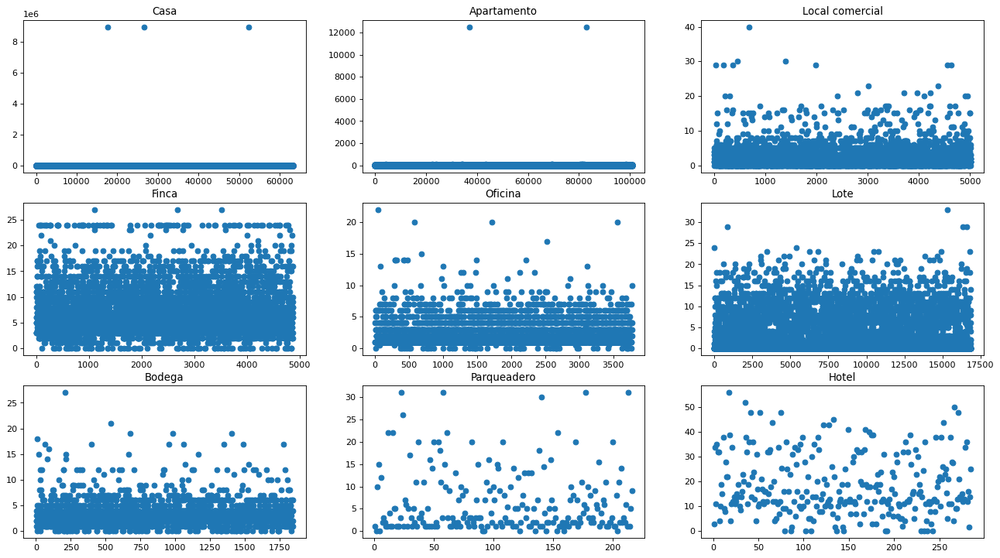

In [99]:
plt.figure(figsize=(20, 15), dpi=80)

tipo = 'Casa'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 1)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Casa")

tipo = 'Apartamento'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 2)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Apartamento")

tipo = 'Local comercial'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 3)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Local comercial")

tipo = 'Finca'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 4)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Finca")

tipo = 'Oficina'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 5)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Oficina")

tipo = 'Lote'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 6)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Lote")

tipo = 'Bodega'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 7)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Bodega")

tipo = 'Parqueadero'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 8)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Parqueadero")

tipo = 'Hotel'
numero = df['amb_ext_ok'][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 9)
plt.scatter(eje_x, df['amb_ext_ok'][df['tipo_prop_ok']==tipo])
plt.title("Hotel")

plt.show()

En las gráficas se ve más claramente como sí hay outliers en los diferentes tipos de propiedades. 

#### Corrección de outliers

Calcularemos los puntos de datos atípicos utilizando el método estadístico llamado rango intercuartílico (IQR). Usando el **IQR**, los puntos de datos atípicos son los que están por debajo de ${Q1 – 1.5 * IQR}$ o por encima de ${Q3 + 1.5 * IQR}$. 

**Q1** es el **percentil 25** y **Q3** es el **percentil 75** del conjunto de datos, y **IQR** representa el rango intercuartílico calculado por **Q3 menos Q1 (${IQR = Q3–Q1}$)**.

In [100]:
# Tipos de propiedades
tipos = df['tipo_prop_ok'].unique().tolist()
# Calculamos el percentil 25 (Q1), el percentil 75 (Q3) y el rango intercuartílico (IQR)
Q1 = [df['amb_ext_ok'][(df['tipo_prop_ok']==tipo) & (df['amb_ext_ok']!=0)].quantile(0.25) for tipo in tipos]
Q3 = [df['amb_ext_ok'][(df['tipo_prop_ok']==tipo) & (df['amb_ext_ok']!=0)].quantile(0.75) for tipo in tipos]
IQR = [Q3[i] - Q1[i] for i in range(len(Q1))]
# Calculamos los outliers minimo (OL_min), maximo (OL_max) y su promedio (Qm)
OL_min = [round(Q1[i] - 1.5 * IQR[i]) if Q1[i] - 1.5 * IQR[i] >= 0 else 0 for i in range(len(Q1))]
OL_max = [round(Q3[i] + 1.5 * IQR[i]) for i in range(len(Q1))]
Qm = [round((OL_min[i] + OL_max[i])/2) for i in range(len(Q1))]

#
def AjusteTipoPropiedad(ambext, tp):
    idx = tipos.index(tp)
    if (ambext>=OL_min[idx] and ambext<=OL_max[idx]):
        return ambext
    elif ambext>OL_max[idx]:
        return Qm[idx]
    
df['amb_ext_ok2'] = df[['amb_ext_ok', 'tipo_prop_ok']].apply(lambda x: AjusteTipoPropiedad(x.amb_ext_ok, x.tipo_prop_ok), axis=1)

#### Gráficas sin outliers

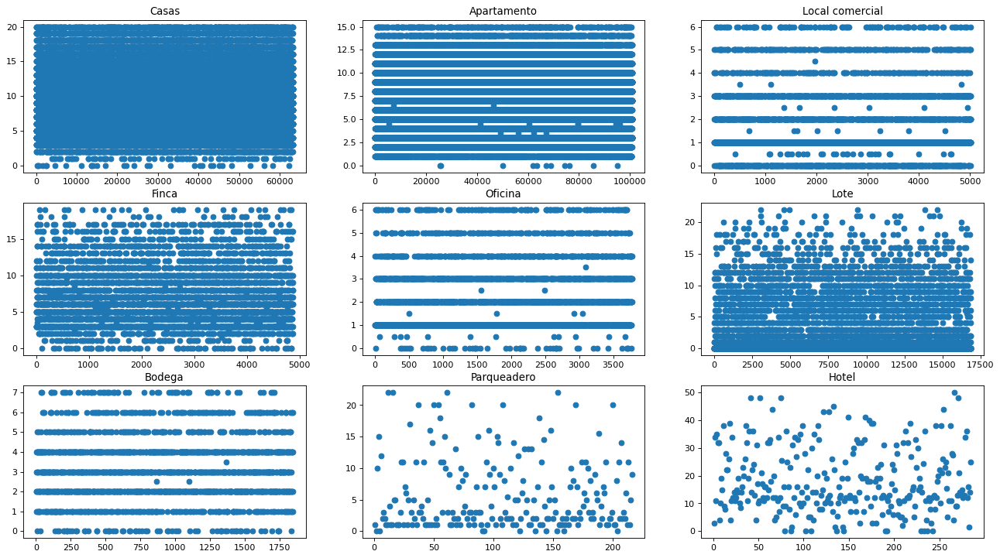

In [101]:
plt.figure(figsize=(20, 15), dpi=80)

columna = 'amb_ext_ok2'

tipo = 'Casa'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 1)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Casas")

tipo = 'Apartamento'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 2)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Apartamento")

tipo = 'Local comercial'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 3)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Local comercial")

tipo = 'Finca'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 4)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Finca")

tipo = 'Oficina'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 5)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Oficina")

tipo = 'Lote'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 6)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Lote")

tipo = 'Bodega'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 7)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Bodega")

tipo = 'Parqueadero'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 8)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Parqueadero")

tipo = 'Hotel'
numero = df[columna][df['tipo_prop_ok']==tipo].shape[0]
eje_x = np.linspace(1.0, numero, numero)
plt.subplot(4, 3, 9)
plt.scatter(eje_x, df[columna][df['tipo_prop_ok']==tipo])
plt.title("Hotel")

plt.show()

In [102]:
# Eliminamos la columna 'amb_ext_ok' del DataFrmae 'data'
data.drop(['amb_ext_ok'], axis=1, inplace=True)
# Combinamos con el DataFrame auxiliar
data = pd.concat([data, df[['amb_ext_ok2']]], axis = 1)
data.tail()

,l2,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok2
196913,Cundinamarca,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0,3.0
196914,Cundinamarca,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0,2.0
196915,Valle del Cauca,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0,1.0,3.0
196916,Cundinamarca,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0,2.0,6.0
196917,Atlántico,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0,1.0,7.0


#### Eliminar registros incoherentes

En lugares como 'Casa', 'Apartamento', 'Oficina', 'Bodega', 'Parqueadero', 'Hotel' debe haber almenos un ambiente, ya sea para baño, cuarto, etc. si no hay ningún ambiente estos registros se eliminarán ya que no tiene sentido lógico tenerlos.

In [103]:
# Estos lugares sin sentido se muestran a continuación
data[(data['amb_ext_ok2']==0) & (data['tipo_prop_ok']!='Lote') & (data['tipo_prop_ok']!='Local comercial') & (data['tipo_prop_ok']!='Finca')]

,l2,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok2
353,Cundinamarca,NaN,NaN,1,SE VENDE BODEGA EN EL CENTRO DE GIRARDOTSe ven...,Bodega,San Mateo,Girardot,0.0,0.0,0.0
534,Valle del Cauca,NaN,NaN,1,Edificio En Arriendo/venta En Cali Nueva Teque...,Parqueadero,El Limonar,Cali,0.0,0.0,0.0
685,Chocó,NaN,NaN,1,OFICINA EN VENTA EN BUENAVENTURA BUENAVENTURA...,Oficina,La Flora,Cali,0.0,0.0,0.0
878,Valle del Cauca,NaN,NaN,0,Venta de Lote en Tulua Urbanización Campestre ...,Casa,None,Tuluá,0.0,0.0,0.0
1393,Cundinamarca,182.0,NaN,0,Casalote En Venta En Chia Chia Cod. VINH2855Ve...,Casa,None,Chía,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
193478,Antioquia,NaN,NaN,0,"OFICINA en venta en RIONEGRO, inmueble AC_390...",Oficina,None,Rionegro,0.0,0.0,0.0
193581,Valle del Cauca,NaN,NaN,0,Venta de Lote en Tuluá Urbanización Brisas de ...,Casa,None,Tuluá,0.0,0.0,0.0
193841,Meta,NaN,NaN,1,"EDIFICIO EN VENTA, VILLAVICENCIO-VILLAVICENCIO...",Oficina,Zona Sur,Villavicencio,0.0,0.0,0.0
195701,Bolívar,750.0,860.0,1,Bodega En Venta En Turbaco Ternera Cod. VMUR26...,Bodega,Carrizal,Turbaco,0.0,0.0,0.0


In [104]:
inc = data[(data['amb_ext_ok2']==0) & (data['tipo_prop_ok']!='Lote') & (data['tipo_prop_ok']!='Local comercial') & (data['tipo_prop_ok']!='Finca')]
porc_val_act = round(inc.shape[0] * 100 / data.shape[0], 4)
print(f'Porcentaje de valores faltantes actualmente: {porc_val_act}%')

Porcentaje de valores faltantes actualmente: 0.0929%


El porcentaje que se eliminará es del **0.0929 %** por lo tanto no representa un valor muy significativo.

In [105]:
# Obtenemos los indices del DataFrame que cumpla con la condición que debe ser eliminada
idx_elim = data[(data['amb_ext_ok2']==0) & (data['tipo_prop_ok']!='Lote') & (data['tipo_prop_ok']!='Local comercial') & (data['tipo_prop_ok']!='Finca')].index
# Eliminamos estos indices filtrados del DataFrmae 'data'
data = data.drop(idx_elim)
# Reestablecemos los indices
data.reset_index(inplace=True, drop=True)
data.tail()

,l2,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok2
196730,Cundinamarca,NaN,NaN,0,LM: VENDO APARTAMENTO EN TORRES DE TINTALAVEND...,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0,3.0
196731,Cundinamarca,NaN,17.0,0,Oficina En Venta En Bogota El Retiro Cod. VREI...,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0,2.0
196732,Valle del Cauca,NaN,NaN,0,Local En Venta En Cali Nueva Tequendama CodVBS...,Local comercial,San Fernando Nuevo,Cali,0.0,1.0,3.0
196733,Cundinamarca,NaN,NaN,0,VENTA CASALOTE FONTIBONCASALOTE BIEN UBICADO F...,Casa,Zona Occidental,Bogotá D.C,4.0,2.0,6.0
196734,Atlántico,NaN,NaN,0,1 Apartamento en remate aprovecha nuestras ofe...,Apartamento,Carrizal,Barranquilla,2.0,1.0,7.0


## Análisis de las columnas: "surface_total"-"surface_covered"

En estas columnas la cantidad de valores faltantes son del: 

* 96.4697% para la columna: 'surface_total'
* 95.0382% para la columna: 'surface_covered'

Para los valores faltantes, usarémos RegEx con la columna 'anuncio'.

### RegEx

In [106]:
# Primero creamos un DataFrame auxiliar 'df'
df = data.copy()
# Rellenamos los NaN con 0 para evitar problemas al manipular el DataFrmae
df[['surface_total', 'surface_covered']] = df[['surface_total', 'surface_covered']].fillna(0)
df.head(3)

,l2,surface_total,surface_covered,price,anuncio,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok2
0,Antioquia,0.0,0.0,1,Hermosa Mansión En El Poblado. Área Construida...,Casa,El Poblado,Medellín,4.0,4.0,11.0
1,Cundinamarca,0.0,0.0,0,"APARTAMENTO EN VENTA, BOGOTA-CIUDAD JARDIN NOR...",Apartamento,Zona Noroccidental,Bogotá D.C,3.0,2.0,8.0
2,Cundinamarca,0.0,0.0,0,Apartamento En Venta En Bogota Bella Suiza Cod...,Casa,Zona Norte,Bogotá D.C,3.0,2.0,8.0


In [107]:
# Usarémos esta función para pasar los string tipo número (por ejemplo '2', '7', etc.) a entero (2, 7, etc.)
def str2num(y):
    try:
        return float(y)
    except:
        return 0
    
# RegEx a evaluar
regEx = re.compile(r'(?:[0-9]+ m2)|(?:[0-9]+m2)|(?:[0-9]+ mts2)|(?:[0-9]+ mt2)|(?:[0-9]+ metros cuadrados)|(?:\d{2}.[0-9]+ mts2)|(?:[0-9]+mts2)|(?:[0-9]+mt2)|(?:[0-9]+ mts)')
# Listas donde se guardaran 'surface_total' y 'surface_covered' encontrados en cada anuncio
sup_tot = []
sup_cov = []
# Iteramos sobre toda la columna 'anuncio'
for texto in tqdm(df['anuncio'], desc='Ejecutando...'):
    print(" ", end='\r')
    # Pasamos el texto a minuscula
    texto_lower = texto.replace('_','').replace(',','').lower()
    # Buscamos en el texto la RegEx
    frase_extraida = re.findall(regEx, texto_lower)
    # Creamos otra lista donde se guardarán los valores que coincidan con la RegEx
    val = []
    # Iteramos en cada RegEx encontrada
    for frase in frase_extraida:
        val.append(str2num(frase.replace('m2','').replace('mt2','').replace(' mts2','').replace('mts2','').replace(' mt2','').replace(' metros cuadrados','')))
    # Acomodamos los valores de menor a mayor
    val.sort()
    # Elegimos el valor de la 'surface_total' y	'surface_covered' encontrado en la RegEx
    if len(val)>1:
        sup_tot.append(val[-1])
        sup_cov.append(val[-2])
    elif len(val)==1:
        sup_tot.append(val[-1])
        sup_cov.append(val[-1])
    else:
        sup_tot.append(0)
        sup_cov.append(0)
    
# Transformamos la lista 'sup_tot' a DataFrame 'df_sup_tot'  
df_sup_tot = pd.DataFrame(sup_tot,  columns=['sup_tot'])
# Transformamos la lista 'sup_cov' a DataFrame 'df_sup_cov'  
df_sup_cov = pd.DataFrame(sup_cov,  columns=['sup_cov'])
# Concatenamos los DataFrames 'df', 'df_sup_tot' y 'df_sup_cov'
df = pd.concat([df, df_sup_tot, df_sup_cov], axis=1)

# Rellenamos los NaN de la columna 'surface_total' con valores 0
df['surface_total'].fillna(0, inplace=True)
# Creamos la nueva columna 'sup_tot_ok' en donde se pondrán los valores encontrados de cada 'surface_total'
df['sup_tot_ok'] = df[['surface_total', 'sup_tot']].apply(lambda x: x.sup_tot if (x.surface_total ==  0) else x.surface_total, axis=1)
# Eliminamos la columna 'sup_tot'
df.drop(['sup_tot'], axis=1, inplace=True)

# Rellenamos los NaN de la columna 'surface_covered' con valores 0
df['surface_covered'].fillna(0, inplace=True)
# Creamos la nueva columna 'sup_cov_ok' en donde se pondrán los valores encontrados de cada 'surface_covered'
df['sup_cov_ok'] = df[['surface_covered', 'sup_cov']].apply(lambda x: x.sup_cov if (x.surface_covered ==  0) else x.surface_covered, axis=1)
# Eliminamos la columna 'sup_cov'
df.drop(['sup_cov'], axis=1, inplace=True)

# Mostramos las columnas 'surface_total', 'sup_tot_ok', 'surface_covered', 'sup_cov_ok'
df[['surface_total', 'sup_tot_ok', 'surface_covered', 'sup_cov_ok']]

Ejecutando...:   0%|          | 0/196735 [00:00<?, ?it/s]

,surface_total,sup_tot_ok,surface_covered,sup_cov_ok
0,0.0,2154.0,0.0,900.0
1,0.0,122.0,0.0,122.0
2,0.0,0.0,0.0,0.0
3,0.0,543.0,0.0,271.0
4,0.0,60.0,0.0,60.0
...,...,...,...,...
196730,0.0,0.0,0.0,0.0
196731,0.0,17.0,17.0,17.0
196732,0.0,0.0,0.0,0.0
196733,0.0,0.0,0.0,0.0


In [108]:
porc_val_act = round((df['sup_tot_ok']==0).sum() * 100 / df.shape[0], 4)
print(f'Porcentaje de valores faltantes en la columna "surface_total" actualmente: {porc_val_act}%')

Porcentaje de valores faltantes en la columna "surface_total" actualmente: 71.8494%


In [109]:
porc_val_act = round((df['sup_cov_ok']==0).sum() * 100 / df.shape[0], 4)
print(f'Porcentaje de valores faltantes en la columna "surface_covered" actualmente: {porc_val_act}%')

Porcentaje de valores faltantes en la columna "surface_covered" actualmente: 71.0972%


En estas columnas la cantidad de valores faltantes se han reducido muy poco: 

* 'surface_total': 96.4697% --> 71.8494%
* 'surface_covered': 95.0382% --> 71.0972%

Como los valores faltantes son demaciados y no hay forma de obtener esta información de algún otro medio, no tomaremos en cuenta estas dos columnas para el modelo de Machine Learning.

In [110]:
# Eliminamos las columnas 'surface_total', 'surface_covered' y 'anuncio'
data.drop(['surface_total', 'surface_covered', 'anuncio'], axis=1, inplace=True)
# Mostramos como quedó el DataFrame
data.head()

,l2,price,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok2
0,Antioquia,1,Casa,El Poblado,Medellín,4.0,4.0,11.0
1,Cundinamarca,0,Apartamento,Zona Noroccidental,Bogotá D.C,3.0,2.0,8.0
2,Cundinamarca,0,Casa,Zona Norte,Bogotá D.C,3.0,2.0,8.0
3,Santander,1,Local comercial,Mejoras Públicas,Bucaramanga,0.0,1.0,1.0
4,Antioquia,0,Apartamento,Belén,Medellín,3.0,2.0,8.0


## Registros faltantes

Después de aplicar toda la transformación en el DataFrame, graficarémos los registros faltantes.

<AxesSubplot:>

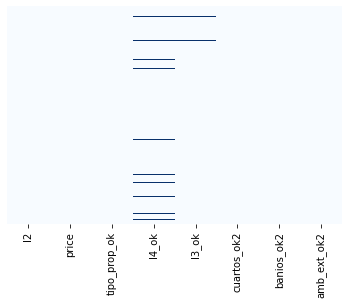

In [111]:
# Visualizamos
sns.heatmap(data.isnull(), yticklabels = False, cbar = False, cmap = 'Blues')

Observamos que la columna con más registros con valores nulos es 'l4_ok'.

Hasta ahora solo hemos eliminado el 0.4115 % de los registros, si también eliminamos los registros nulos de la columna 'l4_ok' (5.3205%), la cantidad de registros total eliminada será del 5.732 %, cantidad que para el tamaño del dataset es pequeña.

In [112]:
# Eliminamos los valores nulos de la columna 'l4_ok'
data = data.dropna(subset=['l4_ok'])
# Reestablecemos los indices
data.reset_index(inplace=True, drop=True)
data.tail()

,l2,price,tipo_prop_ok,l4_ok,l3_ok,cuartos_ok2,banios_ok2,amb_ext_ok2
186310,Cundinamarca,0,Apartamento,Zona Suroccidental,Bogotá D.C,3.0,1.0,3.0
186311,Cundinamarca,0,Oficina,Zona Chapinero,Bogotá D.C,0.0,1.0,2.0
186312,Valle del Cauca,0,Local comercial,San Fernando Nuevo,Cali,0.0,1.0,3.0
186313,Cundinamarca,0,Casa,Zona Occidental,Bogotá D.C,4.0,2.0,6.0
186314,Atlántico,0,Apartamento,Carrizal,Barranquilla,2.0,1.0,7.0


<AxesSubplot:>

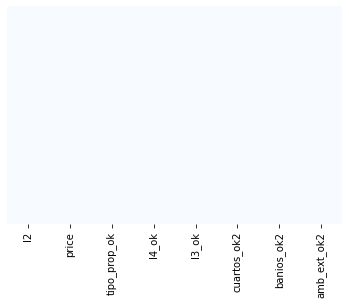

In [113]:
# Visualizamos
sns.heatmap(data.isnull(), yticklabels = False, cbar = False, cmap = 'Blues')

El DataFrame ya no tiene registros nulos. 

Por último, cambiarémos los nombres de las columnas.

In [114]:
# Renombramos las columnas del DataFrame
data = data.rename(columns={'l2':'provincia', 
                            'l3_ok':'ciudad', 
                            'l4_ok':'barrio', 
                            'cuartos_ok2':'cuarto', 
                            'banios_ok2':'banio', 
                            'amb_ext_ok2':'ambientes', 
                            'tipo_prop_ok':'tipo_propiedad', 
                            'price':'barato_caro'})
# Ordenamos las columnas
data = data[['provincia', 'barrio', 'ciudad', 'cuarto', 'banio', 'ambientes', 'tipo_propiedad', 'barato_caro']]
data.tail()

,provincia,barrio,ciudad,cuarto,banio,ambientes,tipo_propiedad,barato_caro
186310,Cundinamarca,Zona Suroccidental,Bogotá D.C,3.0,1.0,3.0,Apartamento,0
186311,Cundinamarca,Zona Chapinero,Bogotá D.C,0.0,1.0,2.0,Oficina,0
186312,Valle del Cauca,San Fernando Nuevo,Cali,0.0,1.0,3.0,Local comercial,0
186313,Cundinamarca,Zona Occidental,Bogotá D.C,4.0,2.0,6.0,Casa,0
186314,Atlántico,Carrizal,Barranquilla,2.0,1.0,7.0,Apartamento,0


# Preprocesamiento de datos.

Una ves limpio el DataFrame, el siguiente paso es dejar las variables listas para poder usarlas en un modelo de Machine Learning.

## Codificación de variables categóricas.

La variable categórica, a diferencia de las variables cardinales o continuas (que permiten cálculos numéricos), clasifica a los individuos o casos. Normalmente toman valores representados por números enteros, como el uno o el cero, pero estos son solo eso, representaciones.

In [118]:
# Variables categoricas (en Dtype: object)
X_cat = data[['provincia', 'barrio', 'ciudad', 'tipo_propiedad']]
X_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186315 entries, 0 to 186314
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   provincia       186315 non-null  object
 1   barrio          186315 non-null  object
 2   ciudad          186315 non-null  object
 3   tipo_propiedad  186315 non-null  object
dtypes: object(4)
memory usage: 5.7+ MB


Tenemos que transformar estas variables con **Dtype: object** a tipo **Dtype: category**.

In [119]:
# Transformación de Dtype: 'object' -> 'category'
X_cat = X_cat.astype('category')
X_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186315 entries, 0 to 186314
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   provincia       186315 non-null  category
 1   barrio          186315 non-null  category
 2   ciudad          186315 non-null  category
 3   tipo_propiedad  186315 non-null  category
dtypes: category(4)
memory usage: 924.3 KB


Después a variables numéricas para poder aplicarlas a un modelo de Machine Learning. Para realizar esto, utilizaremos la libreria de **sklearn** que nos da acceso a una función llamada **OneHotEncoder** que codificará los datos.

In [120]:
# Creamos un objeto de OneHotEncoder:
codificador = OneHotEncoder()
# Transformamos las variables categoricas a númericas:
codificacion = codificador.fit_transform(X_cat)
# obtenemos el nombre de cada columna que se va a crear
nombres_columnas = np.array([item for lista in codificador.categories_ for item in lista])
# Checamos su tamaño:
codificacion.shape

(186315, 379)

Observamos que esta transformación siempre incrementa nuesto número de columnas, en este caso de 4 a 379.

Pasamos la variable **X_cat** a DataFrame:

In [121]:
# Creamos el DataFrame
X_cat = pd.DataFrame(codificacion.toarray(),
                    columns=nombres_columnas)
X_cat

,Antioquia,Arauca,Atlántico,Bolívar,Boyacá,Caldas,Caquetá,Casanare,Cauca,Cesar,...,Zipaquirá,Apartamento,Bodega,Casa,Finca,Hotel,Local comercial,Lote,Oficina,Parqueadero
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
186311,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
186312,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
186313,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [125]:
# Guardamos el nombre de las columnas ya que lo usaremos para relacionar las columnas en nuestra App Web
joblib.dump(X_cat.columns.tolist(), 'list_nombres_columnas')
print('Guardado !!!')

Guardado !!!


## Variables numéricas a utilizar en el modelo.

Aquí creamos un DataFrame que contenga solo variables numéricas de las columnas 'cuarto', 'banio' y 'ambientes' (no incluye a nuestra columna **price**, ya que esta es la columna objetivo). 

In [126]:
# Notemos que hemos elminado la columna objetivo: 'price'.
X_numerical = data[['cuarto', 'banio', 'ambientes']]
X_numerical

,cuarto,banio,ambientes
0,4.0,4.0,11.0
1,3.0,2.0,8.0
2,3.0,2.0,8.0
3,0.0,1.0,1.0
4,3.0,2.0,8.0
...,...,...,...
186310,3.0,1.0,3.0
186311,0.0,1.0,2.0
186312,0.0,1.0,3.0
186313,4.0,2.0,6.0


In [134]:
# Guardamos el valor maximo y minimo en un diccianario ya que lo usaremos para escalar en nuestra App Web
dicc = {
    'cuarto':[X_numerical['cuarto'].max(), X_numerical['cuarto'].min()],
    'banio':[X_numerical['banio'].max(), X_numerical['banio'].min()],
    'ambientes':[X_numerical['ambientes'].max(), X_numerical['ambientes'].min()]
}
joblib.dump(dicc, 'dicc_max_min')
print('Guardado !!!')

Guardado !!!


## Escalado de datos.

Como tenémos dos DataFrame, **X_cat** y **X_numerical**. Tenemos que unirlos para poder trabajarlos como uno solo y asi poder escalarlo.

In [135]:
# Concatenamos ambos DataFrame para tener uno solo relacionado:
X_all = pd.concat([X_cat, X_numerical], axis = 1)
X_all

,Antioquia,Arauca,Atlántico,Bolívar,Boyacá,Caldas,Caquetá,Casanare,Cauca,Cesar,...,Casa,Finca,Hotel,Local comercial,Lote,Oficina,Parqueadero,cuarto,banio,ambientes
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,11.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,8.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,8.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,3.0
186311,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0
186312,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0
186313,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,6.0


El escalado va a transformar los valores de las variables de forma que estén confinados en un rango $[a, b]$, típicamente $[0, 1]$ o $[-1, 1]$. Esto ayuda a que los modelos de **Machine Learning** usen todos los datos de manera uniforme y no haya sesgos hacia una variable debido a su tamaño con respecto a otra.

Para realizar esto, utilizaremos la libreria de **sklearn** que nos da acceso a una función llamada **MinMaxScaler** que escalará los datos.

In [136]:
# Creamos un objeto de MinMaxScaler:
scaler = MinMaxScaler()
# Transformamos las variables escaladas:
X = scaler.fit_transform(X_all)
# Checamos el array:
X

array([[1.        , 0.        , 0.        , ..., 0.09302326, 0.2       ,
        0.22      ],
       [0.        , 0.        , 0.        , ..., 0.06976744, 0.1       ,
        0.16      ],
       [0.        , 0.        , 0.        , ..., 0.06976744, 0.1       ,
        0.16      ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.05      ,
        0.06      ],
       [0.        , 0.        , 0.        , ..., 0.09302326, 0.1       ,
        0.12      ],
       [0.        , 0.        , 1.        , ..., 0.04651163, 0.05      ,
        0.14      ]])

## Vector de predicciones (objetivo)

Este es el vector que usarémos para entrenar nuestro modelo de Machine Learning

In [137]:
# Variable dependiente
y = data['barato_caro']
y

0         1
1         0
2         0
3         1
4         0
         ..
186310    0
186311    0
186312    0
186313    0
186314    0
Name: barato_caro, Length: 186315, dtype: int64

In [138]:
len(X), len(y)

(186315, 186315)

# Procesamiento de datos

## Set de entrenamiento y de prueba.

Lo primero que haremos será dividir el conjunto de entrenamiento en un 75% para crear el modelo y el otro 25% para probar el modelo, verificamos los resultados y asi asegurar que no tiene **Overfitting**.

Para realizar esto, utilizaremos la libreria de **sklearn** que nos da acceso a una función llamada **train_test_split** que nos dará los datos de entrenamiento (X_train, y_train) y prueba (X_test, y_test).

In [139]:
# Creamos los datos de entrenamiento y prueba:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25) # 25% para entrenamiento

print('Sets de entrenamiento y prueba listos !!!')

Sets de entrenamiento y prueba listos !!!


In [140]:
# Tamaño del modelo de entrenamiento:
X_train.shape

(139736, 382)

In [141]:
# Tamaño del modelo de prueba:
X_test.shape

(46579, 382)

## Regresión Logística.

El primer modelo de Machine Learning que usarémos será el de **Regresión Logística.**

Utilizaremos la libreria de **sklearn.linear_model** que nos da acceso a una función llamada **LogisticRegression** para usar la regresión logística y **sklearn.metrics** que nos da acceso a una función llamada **accuracy_score** para obtener la tasa de acierto.

In [142]:
# Creamos un objeto de LogisticRegression:
model_lr = LogisticRegression(max_iter=500)

# Cremos el modelo para predecir usando los datos de entrenamiento:
model_lr.fit(X_train, y_train)

# Hacemos la predicción, para ver si el modelo se comporta bien:
y_pred = model_lr.predict(X_test)

print('\nEl modelo ha sido entrenado!!!')


El modelo ha sido entrenado!!!


### Tasa de acierto del modelo.

La tasa de acierto se calcula de la siguiente forma:

In [143]:
print(f'Tasa de acierto: {round(100*accuracy_score(y_pred, y_test),2)} %')

Tasa de acierto: 83.43 %


### Matriz de confusión.

Utilizaremos la libreria de **sklearn.metrics** que nos da acceso a una función llamada **confusion_matrix** para visualizar la matriz de confusión.

<AxesSubplot:>

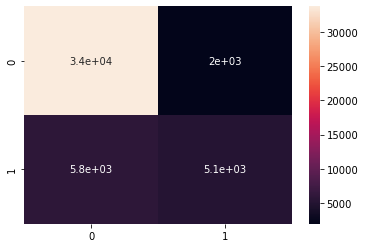

In [144]:
# Cremos la matriz de confusión uasando el vector de predicción (y_pred) y de prueba (y_test):
cm = confusion_matrix(y_test, y_pred)
# Visualizamos la matriz de confusión con un mapa de calor:
sns.heatmap(cm, annot = True)

**El modelo clasifica que:**

* 34,000 verdaderos positivos (TP), 
* 2,300 falsos positivos (FP),
* 5,800 falsos negativos (FN) y 
* 5,100 verdaderos negativos (TN).

### Reporte de clasificación.

Utilizaremos la libreria de **sklearn.metrics** que nos da acceso a una función llamada **classification_report** para obtener los valores de:

* precision    
* recall  
* f1-score   
* support

In [145]:
# Imprimimos las variables:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.95      0.90     35675
           1       0.72      0.47      0.57     10904

    accuracy                           0.83     46579
   macro avg       0.79      0.71      0.73     46579
weighted avg       0.82      0.83      0.82     46579



## Bosques aleatorios.

Utilizaremos la libreria de **sklearn.ensemble** que nos da acceso a una función llamada **RandomForestClassifier** para usar la clasificación por bosques aleatorios.

In [146]:
# Creamos un objeto de RandomForestClassifier:
model_rf = RandomForestClassifier()

# Cremos el modelo para predecir uasando los datos de entrenamiento:
model_rf.fit(X_train, y_train)

# Hacemos la prediccion, para ver si el modelo se comporta bien:
y_pred = model_rf.predict(X_test)

print('El modelo ha sido entrenado!!!')

El modelo ha sido entrenado!!!


### Tasa de acierto del modelo.

In [147]:
print(f'Tasa de acierto: {round(100*accuracy_score(y_pred, y_test),2)} %')

Tasa de acierto: 87.54 %


### Matriz de confusión.

<AxesSubplot:>

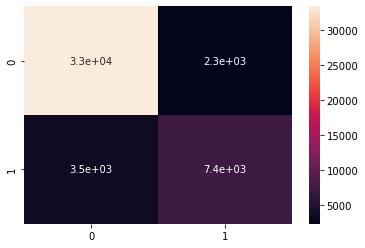

In [148]:
# Resultados en el Conjunto de Testing
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True)

**El modelo clasifica que:**

* 33,000 verdaderos positivos (TP), 
* 2,300 falsos positivos (FP),
* 3,500 falsos negativos (FN) y 
* 7,400 verdaderos negativos (TN).

### Reporte de clasificación.

In [150]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92     35675
           1       0.76      0.68      0.72     10904

    accuracy                           0.88     46579
   macro avg       0.83      0.81      0.82     46579
weighted avg       0.87      0.88      0.87     46579



## Redes neuronales artificiales.

Utilizaremos la libreria de **tensorflow** para utilizar **keras** que nos permite crear *redes neuronales artificiales densas*.

In [151]:
# Creamos un modelo secuencuencial de capas profundas
model_rnn = tf.keras.models.Sequential()
'''
    - units: número de neuronas de la primera capa oculta. 
    - activation: funcion de activacion, para este ejemplo usaremos la funcion rectificador lineal unitario: "relu".
    - input_shape: Número de columnas de nuestro dataset, X_all.
'''
# Añadimos una primera capa densa (de entrada):
model_rnn.add(tf.keras.layers.Dense(units = 500, activation = 'relu', input_shape = (X_train.shape[1], )))

# Añadimos una segunda capa densa (oculta):
model_rnn.add(tf.keras.layers.Dense(units = 500, activation = 'relu'))

# Añadimos una tercera capa densa (oculta):
model_rnn.add(tf.keras.layers.Dense(units = 500, activation = 'relu'))

# Añadimos una cuarta capa densa (de salida):
model_rnn.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

# Podemos ver la arquitectura de nuestra red neuronal:
model_rnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               191500    
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 1)                 501       
                                                                 
Total params: 693,001
Trainable params: 693,001
Non-trainable params: 0
_________________________________________________________________


Compilamos el modelo indicando el optimizador que se va a utilizar (optimizador de Adam) y la funcion de perdidas para medir el error.

In [152]:
# Compilamos el modelo
model_rnn.compile(optimizer = 'Adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

print('Compilado listo !!')

Compilado listo !!


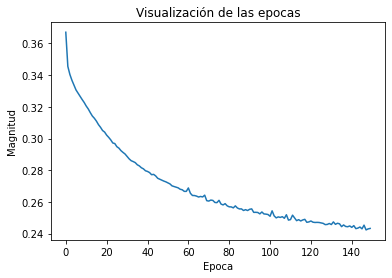

In [153]:
# Entrenamos el modelo:
epochs_hist = model_rnn.fit(X_train, y_train, epochs = 150, batch_size = 50, verbose = False)

# Graficamos el comportamiento del entrenamiento de la Red Neuronal Artificial
plt.title("Visualización de las epocas")
plt.xlabel("Epoca")
plt.ylabel("Magnitud")
plt.plot(epochs_hist.history['loss'])

En el gráfico se observa como fue convirgiendo el entrenamiento.

In [154]:
# Hacemos la prediccion, para ver si el modelo se comporta bien:
y_pred = model_rnn.predict(X_test)

1456/1456 [==============================] - 2s 2ms/step


In [155]:
# Transformamos a 0 y 1
y_pred = (y_pred > 0.5)

print('Predicción lista !!!')

Predicción lista !!!


### Tasa de acierto del modelo.

In [156]:
print(f'Tasa de acierto: {round(100*accuracy_score(y_pred, y_test),2)} %')

Tasa de acierto: 86.85 %


### Matriz de confusión.

<AxesSubplot:>

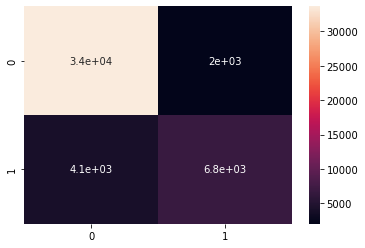

In [157]:
# Resultados en el Conjunto de Testing
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True)

**El modelo clasifica que:**

* 34,000 verdaderos positivos (TP), 
* 2,300 falsos positivos (FP),
* 4,100 falsos negativos (FN) y 
* 6,800 verdaderos negativos (TN).

### Reporte de clasificación.

In [158]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.94      0.92     35675
           1       0.77      0.63      0.69     10904

    accuracy                           0.87     46579
   macro avg       0.83      0.78      0.80     46579
weighted avg       0.86      0.87      0.86     46579



## Comparación de los 3 modelos

1) LogisticRegression:

    * Accuracy: 83.43 %
    * Recall(0): 0.95
    * Recall(1): 0.47


2) RandomForestClassifier:

    * Accuracy: 87.54 %
    * Recall(0): 0.94
    * Recall(1): 0.68


3) ArtificialNeuralNetwork:

    * Accuracy: 86.85 %
    * Recall(0): 0.94
    * Recall(1): 0.63

Por lo tanto, utilizaremos el modelo de RandomForestClassifier para clasificar el dataset del test.

# Exportación del modelo de Machine Learning

Entrenarémos un modelo de **RandomForestClassifier** con todo el DataFrame y lo exportaremos usando la librería **joblib** para poner el modelo en producción en una aplicación web usando la librería **streamlit.**

## Modelo: RandomForestClassifier

In [159]:
# Creamos un objeto de RandomForestClassifier:
model_RFC = RandomForestClassifier()

# Creamos el modelo para predecir uasando los datos de entrenamiento:
model_RFC.fit(X, y)
print('El modelo ha sido entrenado !!!')

El modelo ha sido entrenado !!!


## Exportamos el modelo

In [160]:
# Exportamos el modelo
joblib.dump(model_RFC, 'modelo_random_forest_classifier')
print('Modelo exportado !!!')

Modelo exportado !!!
